In [5]:
## import essential modules 
import qumcmc 
from qumcmc.basic_utils import *
# from qumcmc.energy_models import IsingEnergyFunction
from qumcmc.energy_models import IsingEnergyFunction, Exact_Sampling
from qumcmc.prob_dist import DiscreteProbabilityDistribution

from qumcmc.classical_mcmc_routines import classical_mcmc
#from qumcmc.quantum_mcmc_routines_qulacs import quantum_enhanced_mcmc     #for Qulacs Simulator backend (** Faster )
from qumcmc.quantum_mcmc_routines_qulacs_exact import quantum_mcmc_exact
#  from qumcmc.quantum_mcmc_routines_qiskit import quantum_enhanced_mcmc   #for qiskit Aer's Simulator backend 

from qumcmc.trajectory_processing import calculate_running_js_divergence, calculate_running_kl_divergence, calculate_runnning_magnetisation, get_trajectory_statistics, PLOT_KL_DIV, PLOT_MAGNETISATION, PLOT_MCMC_STATISTICS, ProcessMCMCData
from scipy.linalg import expm
from qulacs.gate import DenseMatrix, SparseMatrix
from qulacs import QuantumState
from qumcmc.quantum_mcmc_routines_qulacs import quantum_enhanced_mcmc
from qumcmc.quantum_mcmc_qulacs_2 import quantum_enhanced_mcmc_2
from qumcmc.quantum_mcmc_routines_qulacs_exact import quantum_mcmc_exact


import pickle
import os 

import matplotlib.pyplot as plt


In [6]:
name = 'GAMMA-RANGES.pkl'
with open(name, 'rb') as f :
    GAMMA_RANGES = pickle.load(f)

In [7]:
name = 'BAS3-MIXER_SETTINGS.pkl'
with open(name, 'rb') as f :
    MIXER_SETTINGS = pickle.load(f)

     MODEL : ising model BAS 9X9 bars only |  beta : 1.5
Num Most Probable States : 6
Entropy : 2.5849625007211547
---------------------------------------------


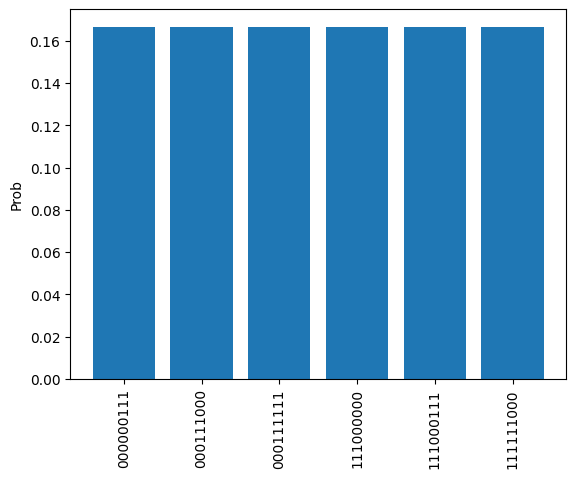

In [8]:
gridsize=3
bas=bas_dataset(grid_size=gridsize)
bas.dataset.sort()
# considering only stripes dataset
wt=hebbing_learning(bas.bas_dict['bars'])

# creating ising model for the bas stripes only dataset
n_spins=gridsize*gridsize
shape_of_J=(n_spins,n_spins)
J=-1*wt
h=np.zeros(n_spins)
model=IsingEnergyFunction(J,h,name=f'ising model BAS {n_spins}X{n_spins} bars only')

# model.model_summary()
beta=1.5
## run exact sampling over all possible configurations 
exact_sampled_model = Exact_Sampling(model, beta)

## get distribution from the model
bpd= DiscreteProbabilityDistribution(exact_sampled_model.boltzmann_pd)
exact_sampled_model.sampling_summary()

## EXP 1

In [14]:
experiment1_filename = 'SamplingData/BAS3/MIXINGDATA_BAS3_1.pkl'
experimentresult1_filename = 'SamplingData/BAS3/MIXINGRESULT_BAS3_1.pkl'

In [15]:
with open(experiment1_filename, 'rb') as f: MIXINGDATA = pickle.load(f)
with open(experimentresult1_filename, 'rb') as f: MIXINGRESULT = pickle.load(f)

In [7]:
num_chains = 10
mcmc_settings_to_experiment = ['qu-wt1', 'qu-wt2', 'qu-wt3', 'qu-alt-wt1-wt3', 'qu-stabilizers-wt3']

In [41]:
# for chain_no in tqdm(range(num_chains)):
#     for mcmc_setting in mcmc_settings_to_experiment:

#         steps = 2000
#         mcmc_chain = quantum_enhanced_mcmc_2(
#             n_hops= steps,
#             model= model,
#             temperature= 1/beta,
#             verbose= False,
#             name= mcmc_setting,
#             gamma_range= (0.999, 1.0),
#             initial_state= bpd.get_sample(1)[0],
#             mixer= MIXER_SETTINGS[mcmc_setting]['mixer']
#         )
        
#         MIXINGDATA[chain_no][mcmc_setting] = mcmc_chain
#         with open(experiment_filename, 'wb') as f: pickle.dump(MIXINGDATA, f)


100%|██████████| 10/10 [03:05<00:00, 18.60s/it]


In [8]:
# MIXINGRESULT = ProcessMCMCData(MIXINGDATA, exact_sampled_model, savefile_path= 'SamplingData/BAS3', name= 'MIXINGRESULT_BAS3'   )
# MIXINGRESULT.PROCESS_ALL()
# MIXINGRESULT.UPDATE_DATA(MIXINGDATA, None, None, save_data= True)

OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3


In [10]:
MIXINGRESULT.processed_data['KL-DIV'];

#### Results

<Figure size 2500x1600 with 0 Axes>

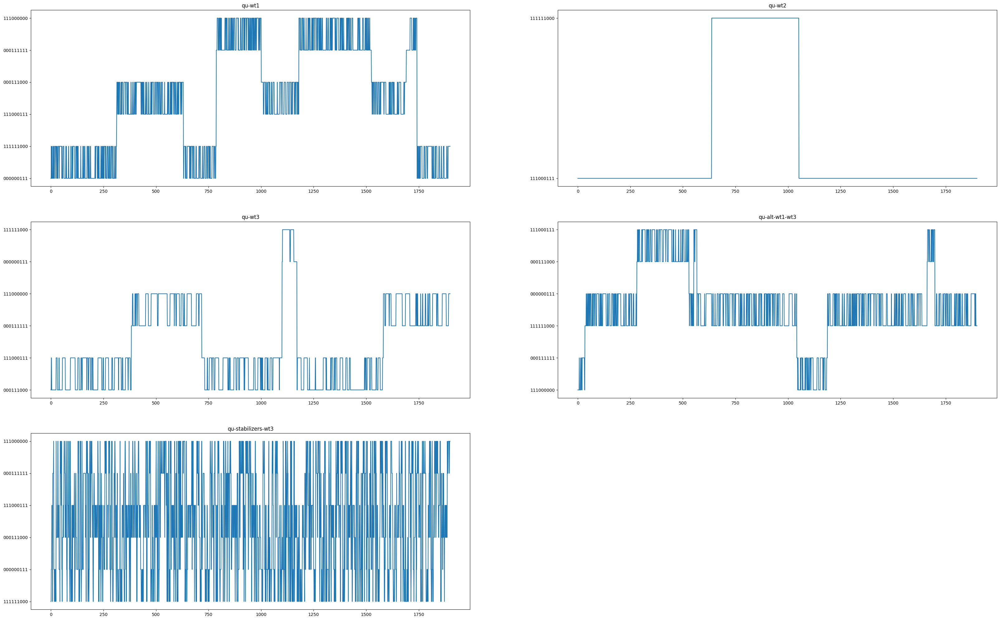

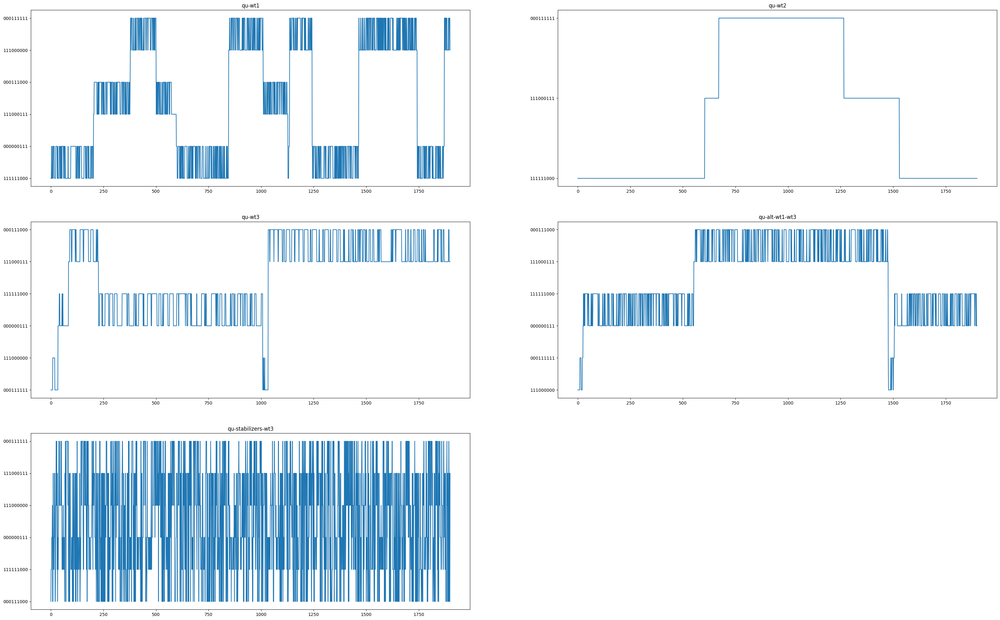

In [8]:
plt.figure(figsize= (25,16))
plot_mcmc_iterations(MIXINGDATA[5]);plot_mcmc_iterations(MIXINGDATA[6])

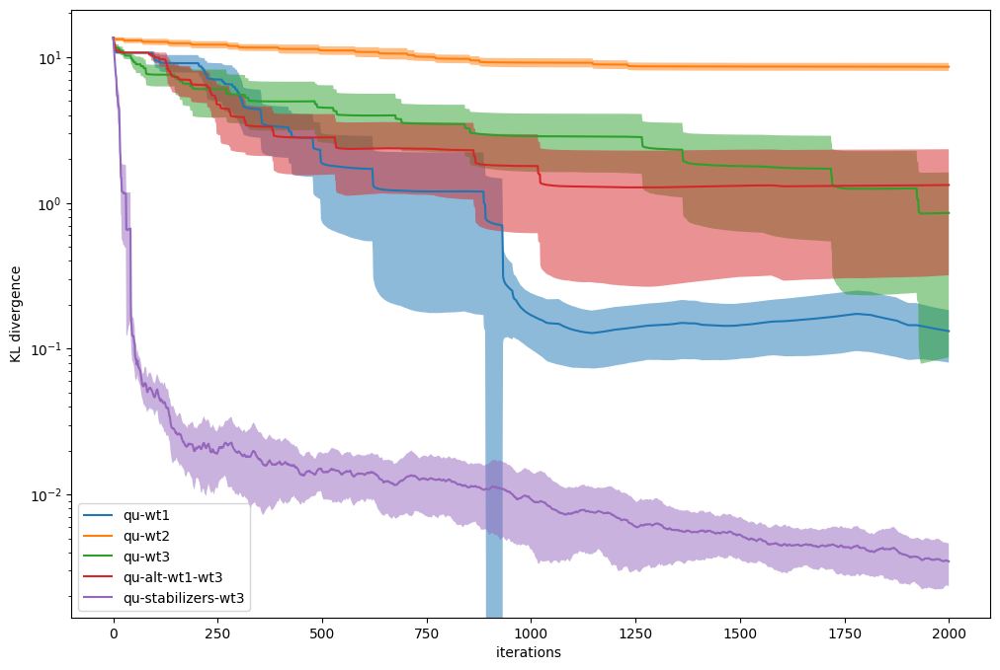

In [9]:
PLOT_KL_DIV(MIXINGRESULT, mcmc_types_to_plot= mcmc_settings_to_experiment)

In [13]:
mcmc_settings_to_plot = ['qu-wt1', 'qu-wt2', 'qu-stabilizers-wt3', 'qu-wt3']

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:00<00:00, 25.01it/s]


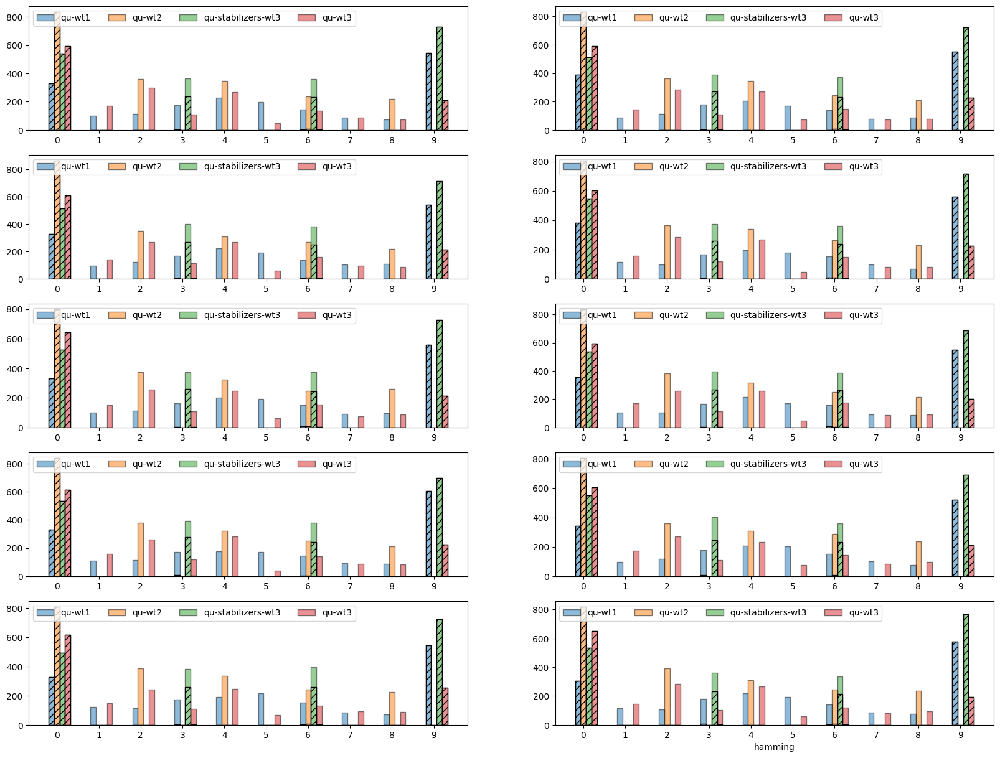

In [14]:
PLOT_MCMC_STATISTICS(MIXINGRESULT, mcmc_types_to_plot= mcmc_settings_to_plot, statistic_to_plot= 'hamming')

## EXP 4

In [10]:
experiment4_filename = 'SamplingData/BAS3/MIXINGDATA_BAS3_4.pkl'
experimentresult4_filename = 'SamplingData/BAS3/MIXINGRESULT_BAS3_4.pkl'

In [36]:
num_chains = 10 ##
steps = 3000 ##
mcmc_settings_to_experiment = ['qu-wt1', 'qu-wt2', 'qu-wt3', 'qu-stabilizers-wt3']
zero_model = IsingEnergyFunction(np.zeros((n_spins, n_spins)), np.zeros((n_spins))  )
beta = 1.0 ; 

/home/pafloxy/Documents/QBMS/quMCMC/qumcmc/energy_models.py:35: RuntimeWarning: divide by zero encountered in scalar divide
  self.alpha = np.sqrt(self.num_spins) / np.sqrt( sum([J[i][j]**2 for i in range(self.num_spins) for j in range(i)]) + sum([h[j]**2 for j in range(self.num_spins)])  )


In [37]:
MIXINGDATA4 = { gamma_range : { i: {} for i in range(num_chains)  } for gamma_range in GAMMA_RANGES.keys() }

In [44]:
# with open(experiment4_filename, 'rb') as f: MIXINGDATA4 = pickle.load(f)
# with open(experimentresult4_filename, 'rb') as f: MIXINGRESULT4 = pickle.load(f)

In [38]:
for gamma_range in GAMMA_RANGES.keys():
    for chain_no in tqdm(range(num_chains), desc= str(gamma_range)):
        for mcmc_setting in mcmc_settings_to_experiment:

            steps = steps ##
            mcmc_chain = quantum_enhanced_mcmc_2(
                n_hops= steps,
                model= model,
                mismatched_model= [True, zero_model],
                temperature= 1/beta,
                verbose= False,
                name= mcmc_setting,
                gamma_range= GAMMA_RANGES[gamma_range] ,
                initial_state= bpd.get_sample(1)[0],
                mixer= MIXER_SETTINGS[mcmc_setting]['mixer']
            )
            
            MIXINGDATA4[gamma_range][chain_no][mcmc_setting] = mcmc_chain
            with open(experiment4_filename, 'wb') as f: 
                pickle.dump(MIXINGDATA4 ,f)


e: 100%|██████████| 10/10 [04:56<00:00, 29.69s/it]


In [51]:
MIXINGRESULT4 = { gamma_range : {} for gamma_range in GAMMA_RANGES.keys() } 

for gamma_range in GAMMA_RANGES.keys():
    MIXINGRESULT4[gamma_range] = ProcessMCMCData(MIXINGDATA4[gamma_range], exact_sampled_model, savefile_path= 'SamplingData/BAS3/', name= "MIXINGRESULT_BAS3_4")
    MIXINGRESULT4[gamma_range].PROCESS_ALL(save_data= True)
    with open(experimentresult4_filename, 'wb') as f: pickle.dump(MIXINGRESULT4, f)

OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]


#### Results4

##### Trajectory vis

gamma range : (0.0, 0.1)


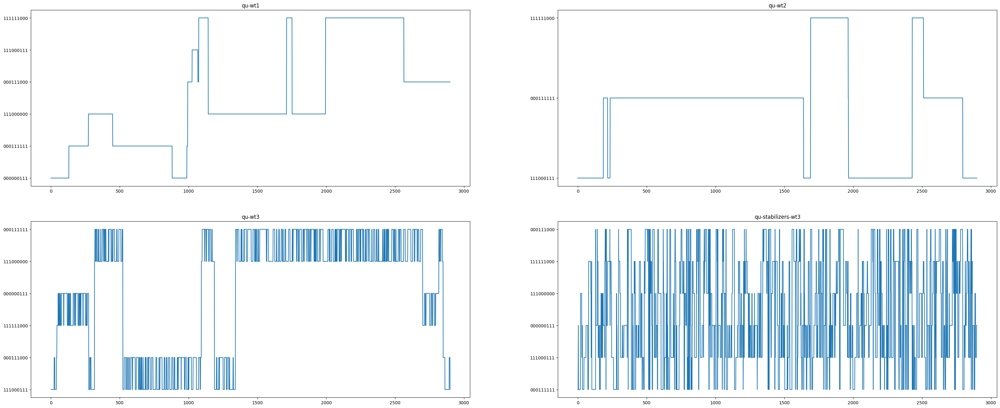

gamma range : (0.1, 0.3)


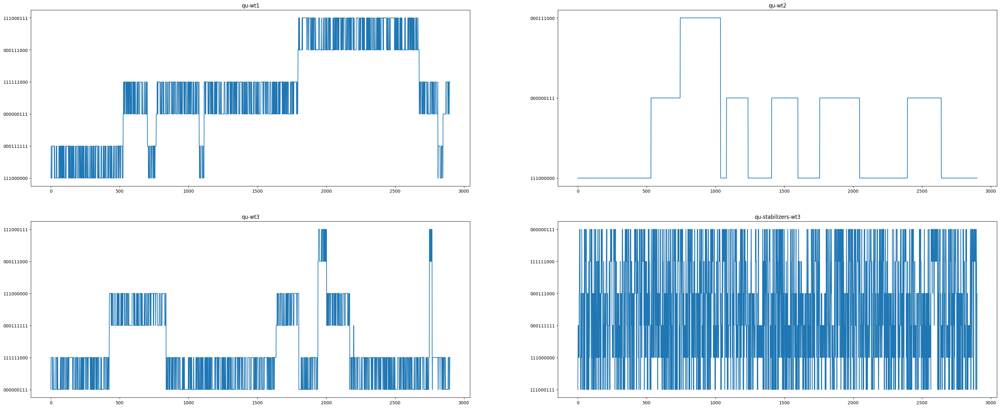

gamma range : (0.3, 0.6)


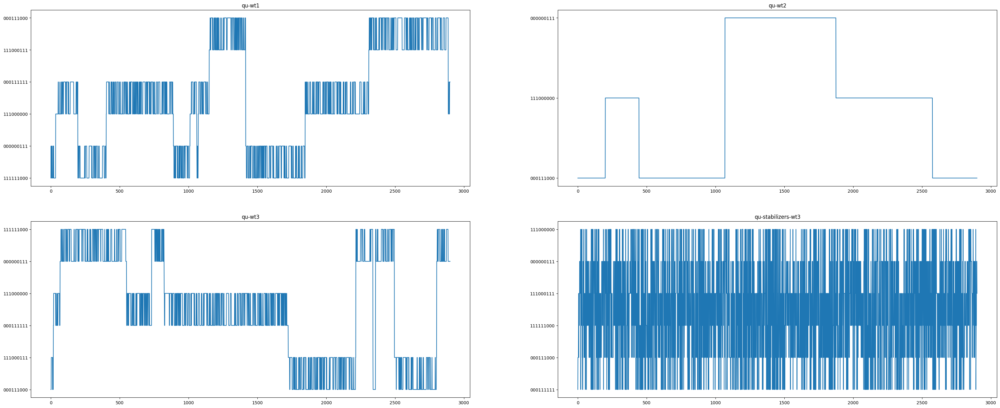

gamma range : (0.6, 0.9)


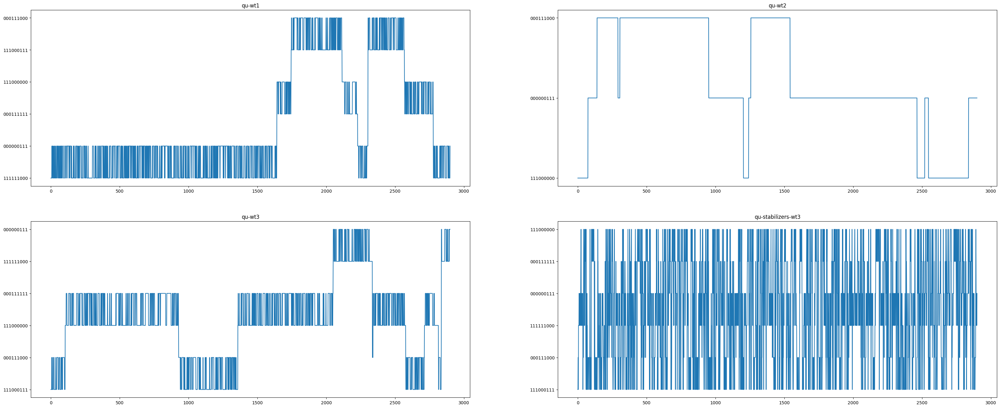

gamma range : (0.9, 1.0)


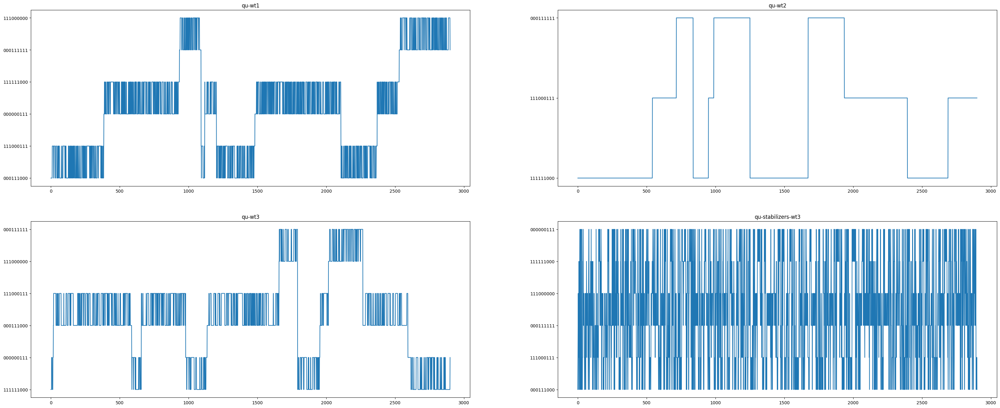

In [39]:
# plt.figure(figsize= (25,16))
for gamma_range in GAMMA_RANGES.keys():
    print('gamma range : '+ str(GAMMA_RANGES[gamma_range]))
    plot_mcmc_iterations(MIXINGDATA4[gamma_range][np.random.randint(0,num_chains)], )

##### KL Div

GAMMA-RANGE: (0.0, 0.1)


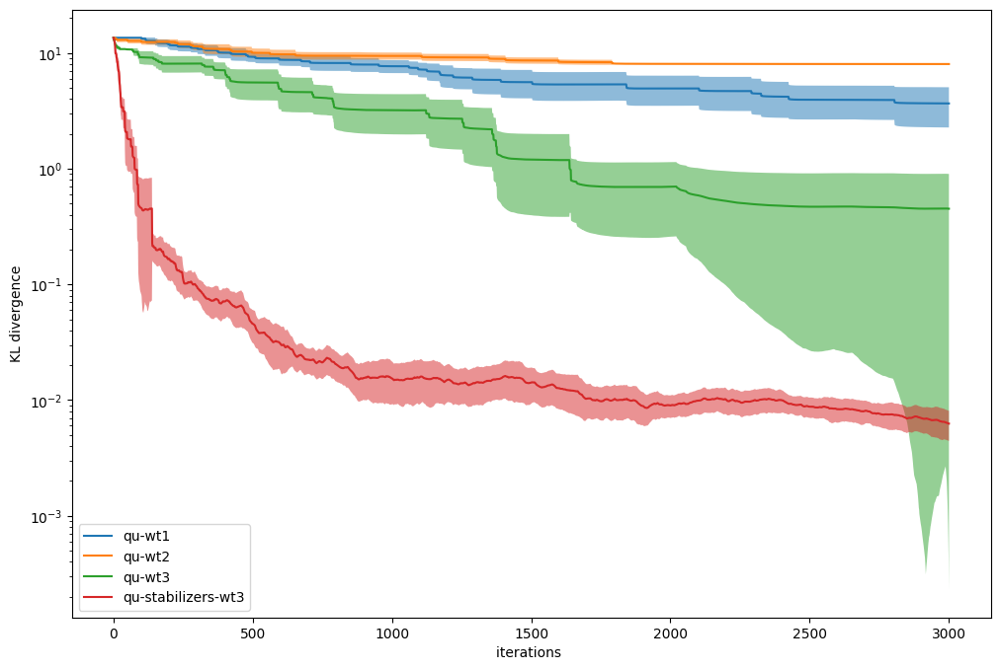

GAMMA-RANGE: (0.1, 0.3)


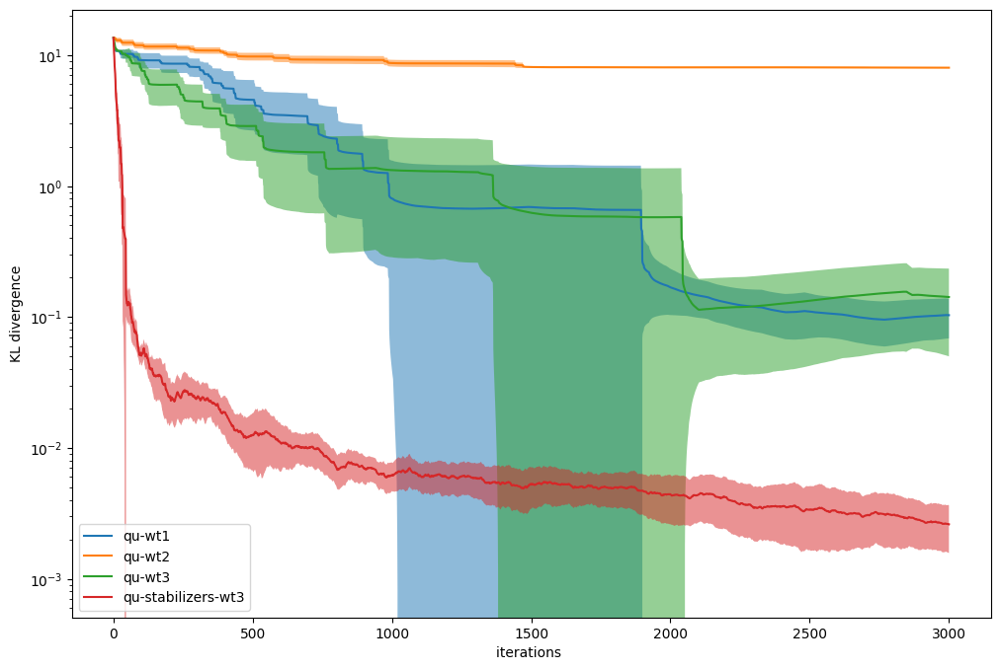

GAMMA-RANGE: (0.3, 0.6)


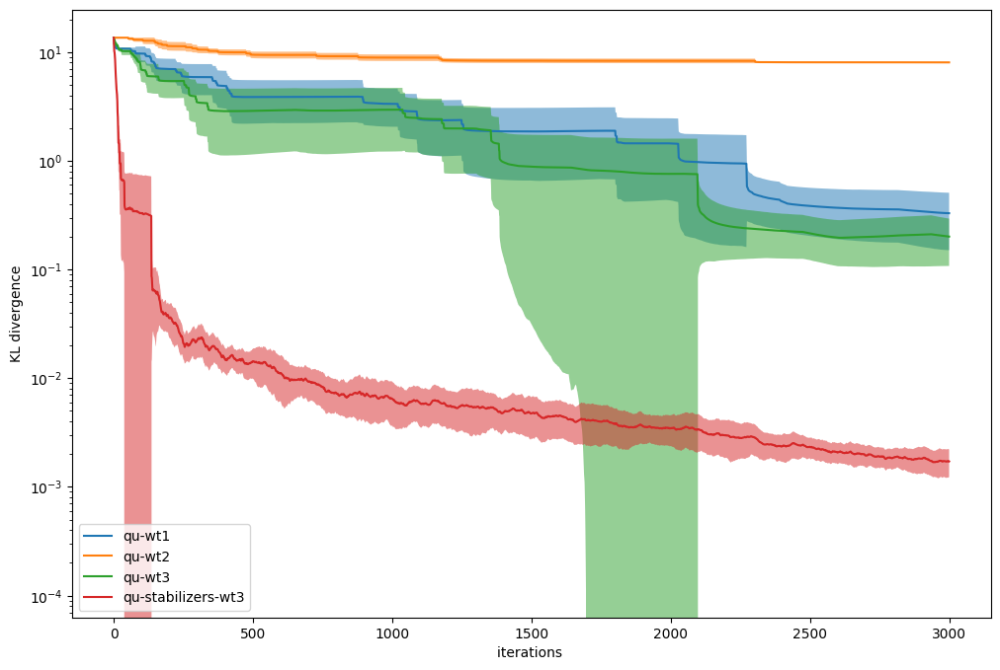

GAMMA-RANGE: (0.6, 0.9)


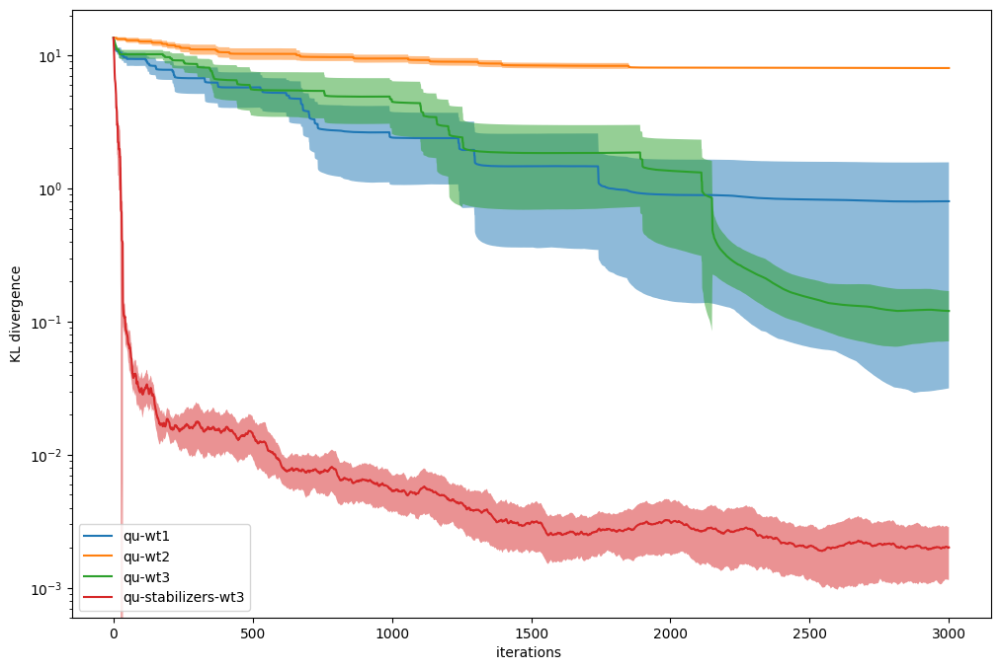

GAMMA-RANGE: (0.9, 1.0)


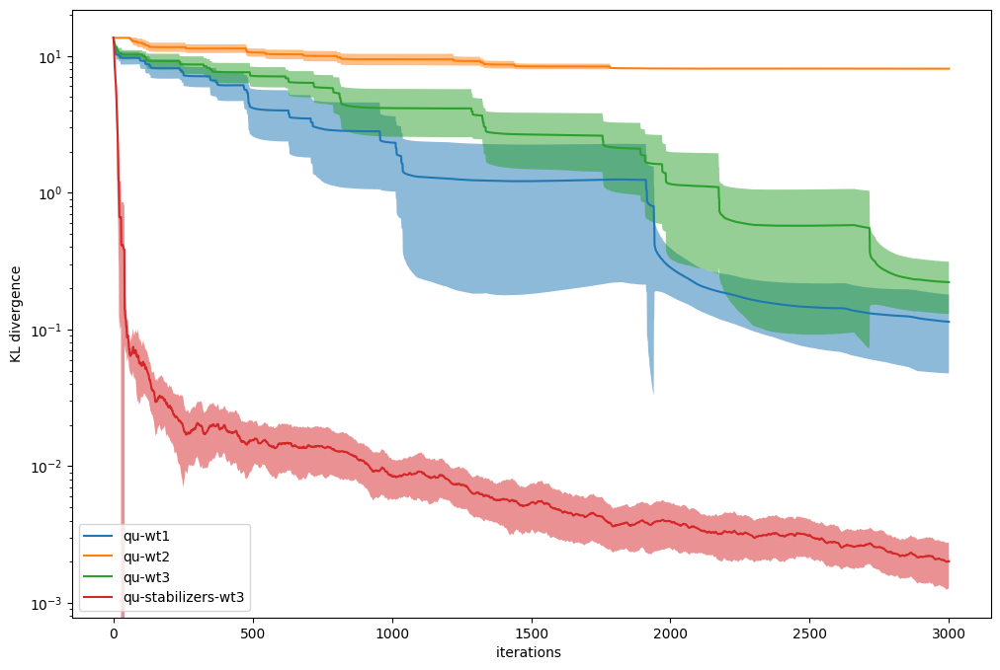

In [52]:
for k in GAMMA_RANGES.keys():
    print('GAMMA-RANGE: ' + str(GAMMA_RANGES[k]))
    PLOT_KL_DIV(MIXINGRESULT4[k], mcmc_types_to_plot= ['qu-wt1', 'qu-wt2', 'qu-wt3', 'qu-stabilizers-wt3'])

##### Magnetisation

GAMMA-RANGE: (0.0, 0.1)


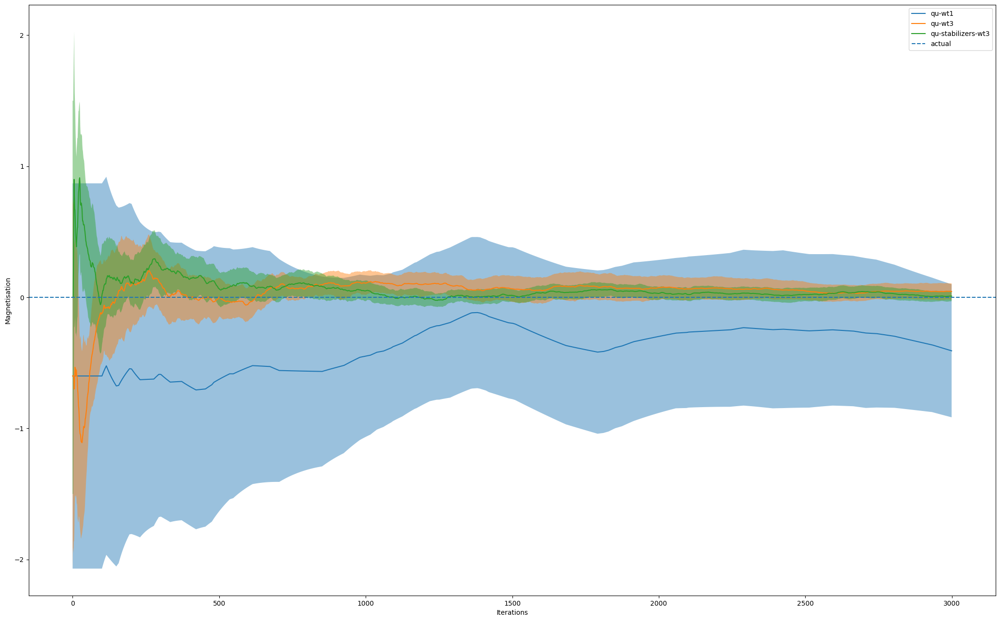

GAMMA-RANGE: (0.1, 0.3)


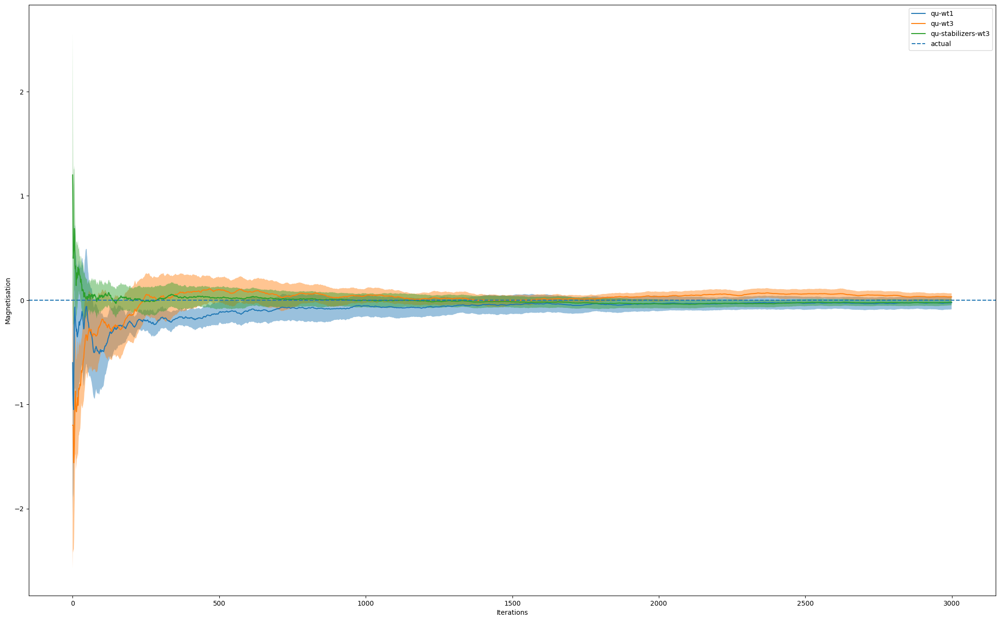

GAMMA-RANGE: (0.3, 0.6)


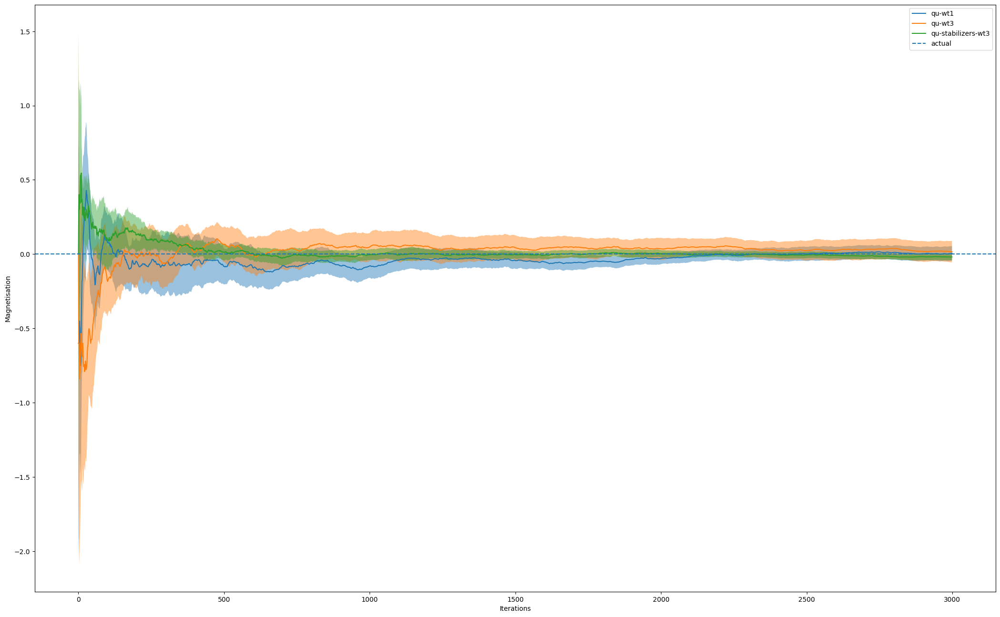

GAMMA-RANGE: (0.6, 0.9)


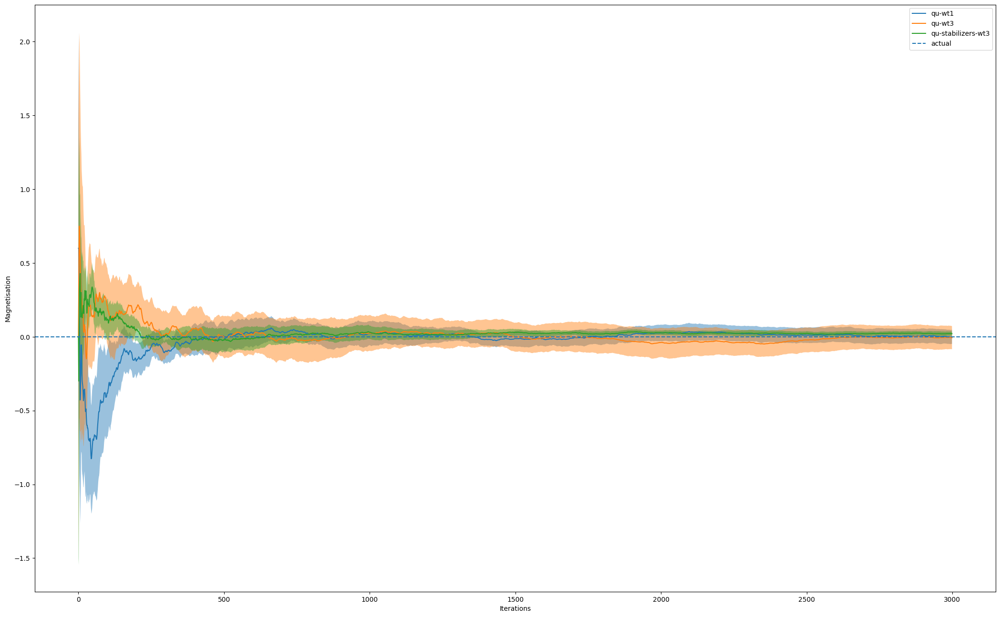

GAMMA-RANGE: (0.9, 1.0)


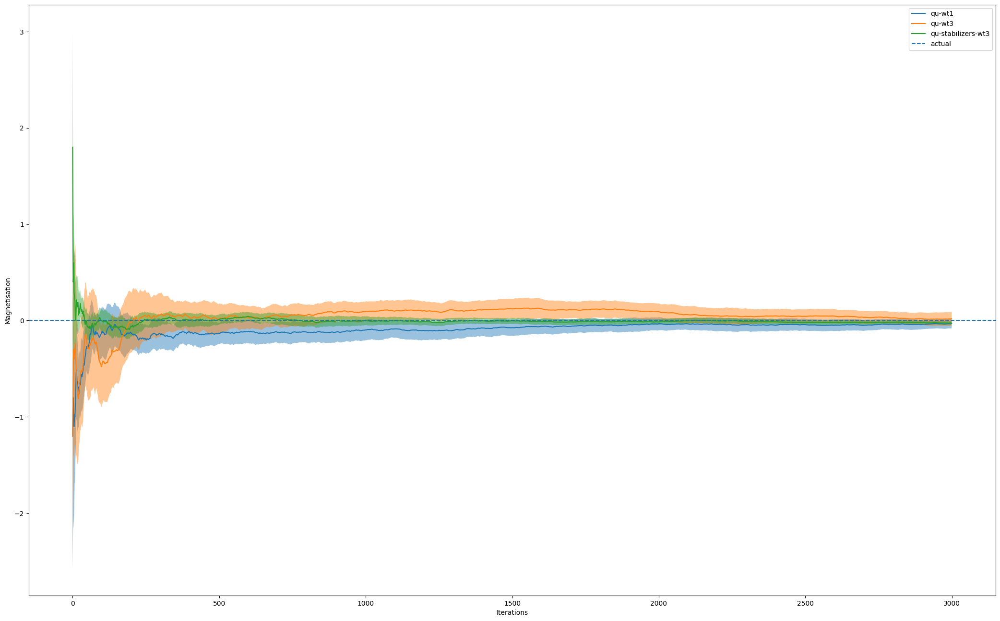

In [55]:
for k in GAMMA_RANGES.keys():
    print('GAMMA-RANGE: ' + str(GAMMA_RANGES[k]))
    PLOT_MAGNETISATION(MIXINGRESULT4[k], mcmc_types_to_plot= ['qu-wt1', 'qu-wt3', 'qu-stabilizers-wt3'])

##### Proposition Analysis

GAMMA-RANGE: (0.0, 0.1)


100%|██████████| 10/10 [00:01<00:00,  6.66it/s]


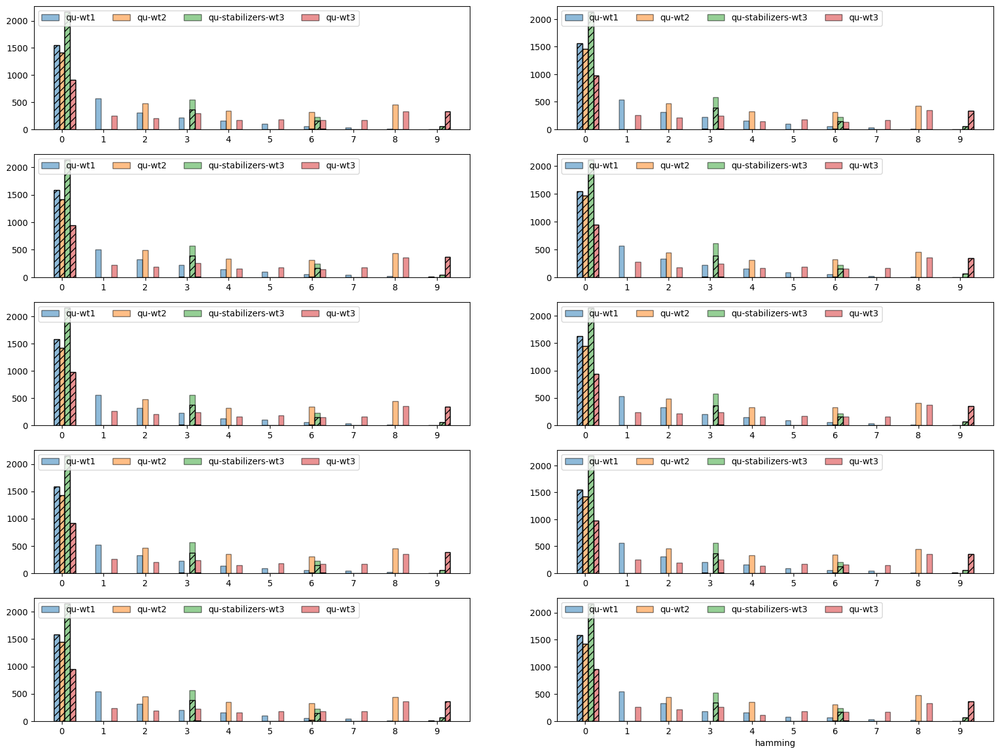

GAMMA-RANGE: (0.1, 0.3)


100%|██████████| 10/10 [00:01<00:00,  8.70it/s]


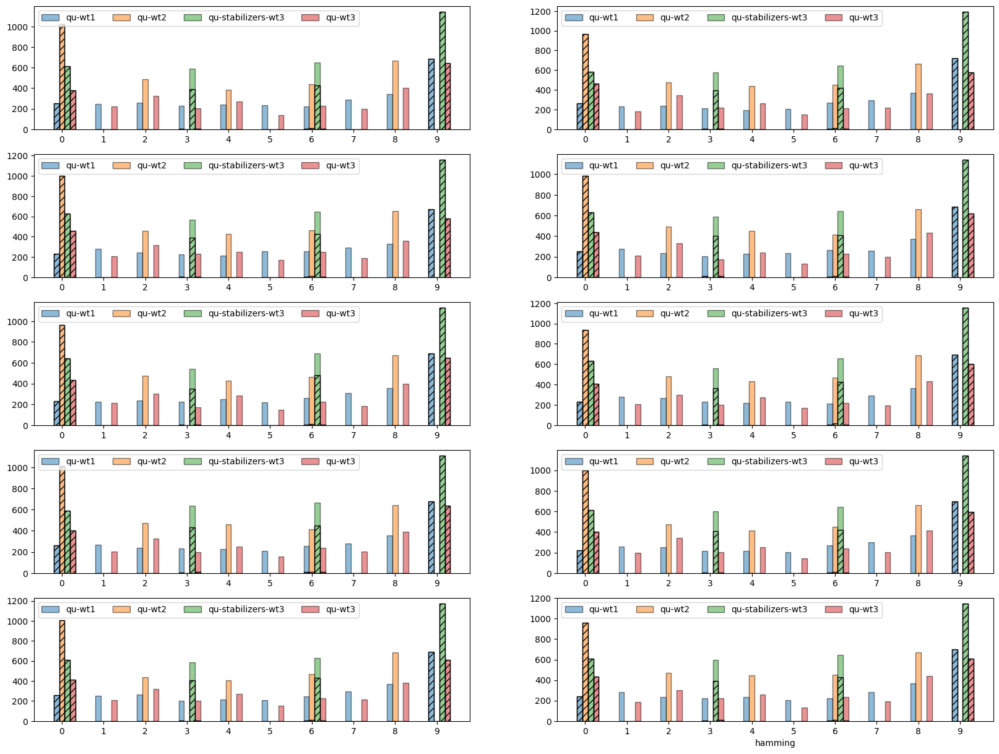

GAMMA-RANGE: (0.3, 0.6)


100%|██████████| 10/10 [00:02<00:00,  4.68it/s]


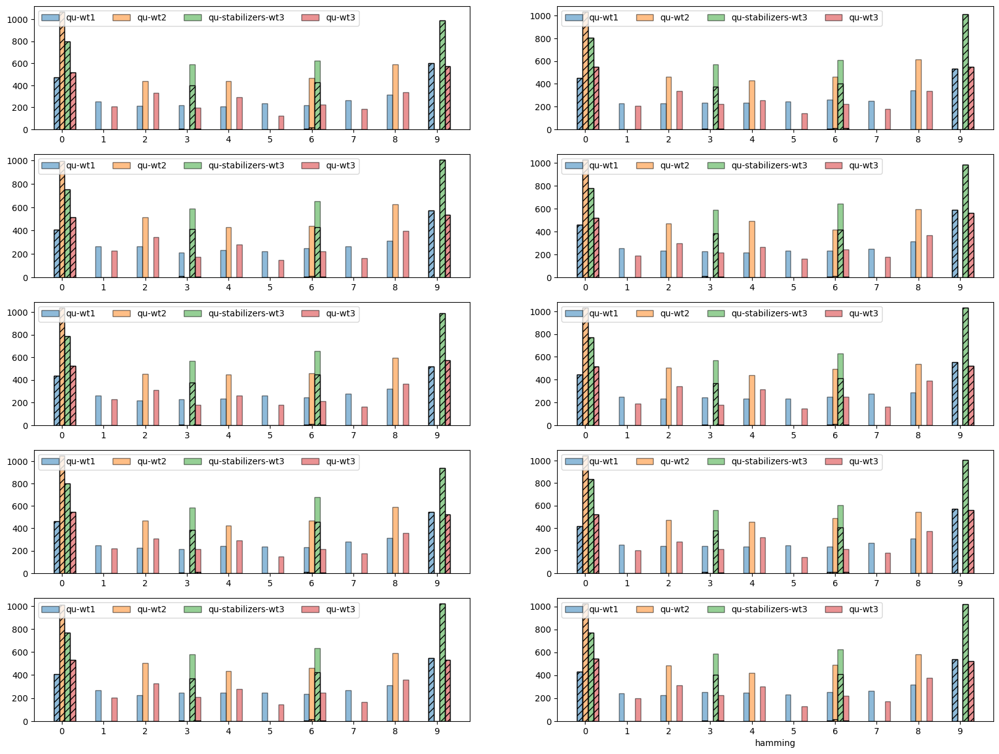

GAMMA-RANGE: (0.6, 0.9)


100%|██████████| 10/10 [00:01<00:00,  7.86it/s]


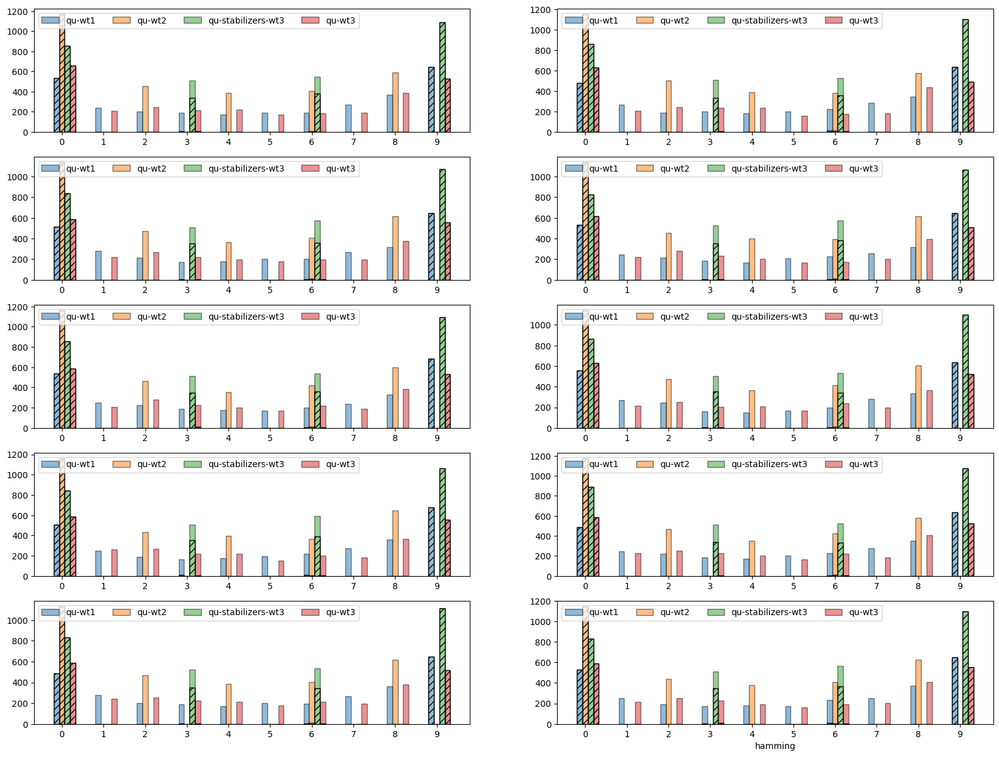

GAMMA-RANGE: (0.9, 1.0)


100%|██████████| 10/10 [00:01<00:00,  9.14it/s]


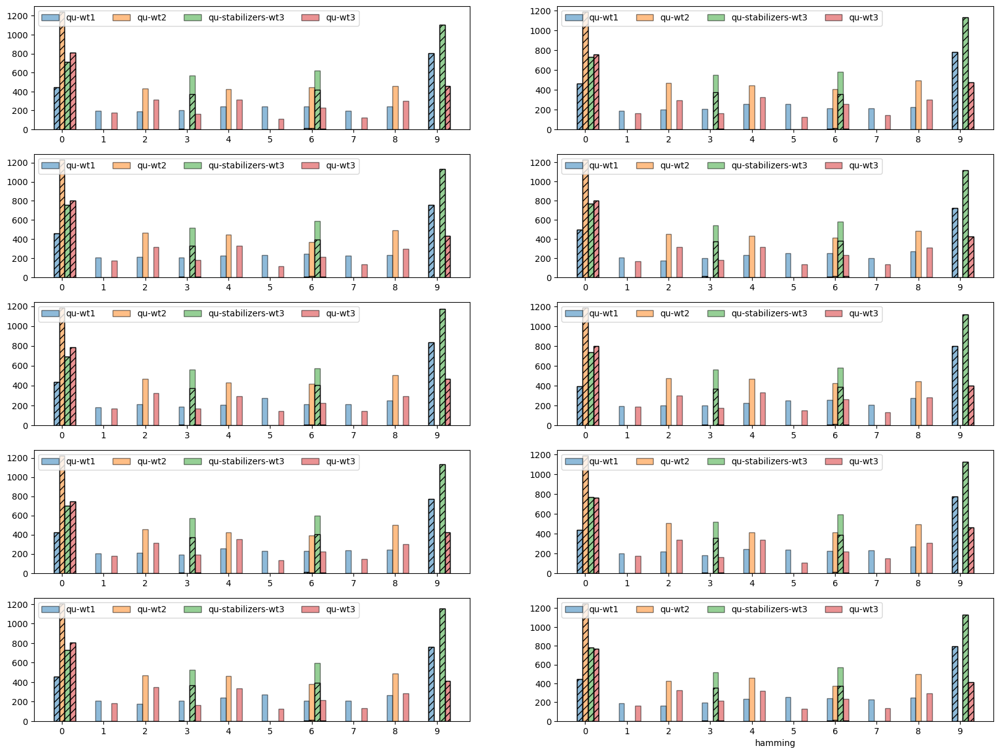

In [53]:
for k in GAMMA_RANGES.keys():
    print('GAMMA-RANGE: ' + str(GAMMA_RANGES[k]))
    PLOT_MCMC_STATISTICS(MIXINGRESULT4[k], mcmc_types_to_plot=['qu-wt1', 'qu-wt2', 'qu-stabilizers-wt3', 'qu-wt3'], statistic_to_plot= 'hamming')

#### Results EXP2

<Figure size 2500x1600 with 0 Axes>

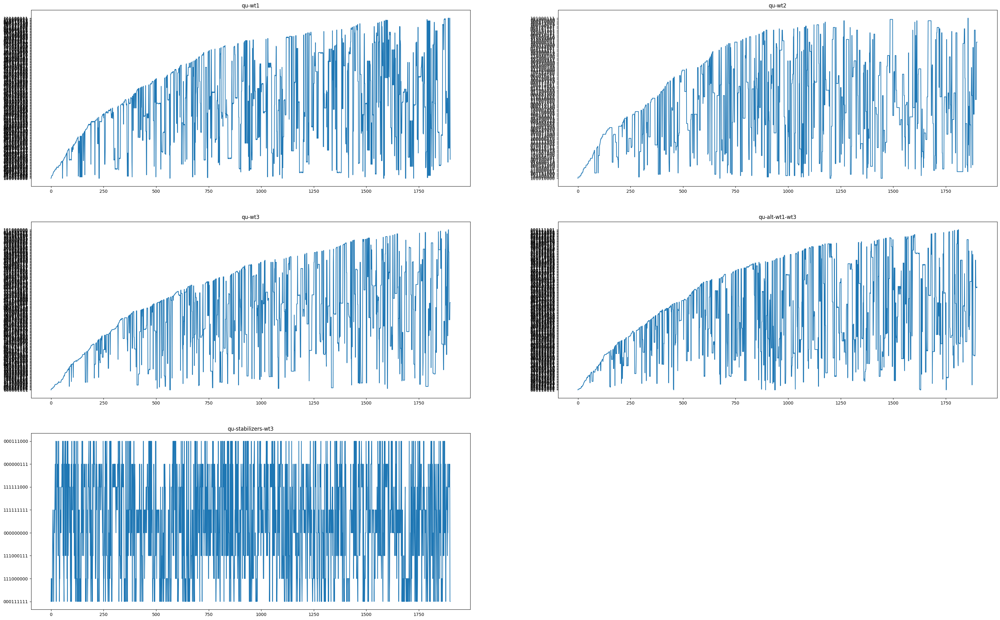

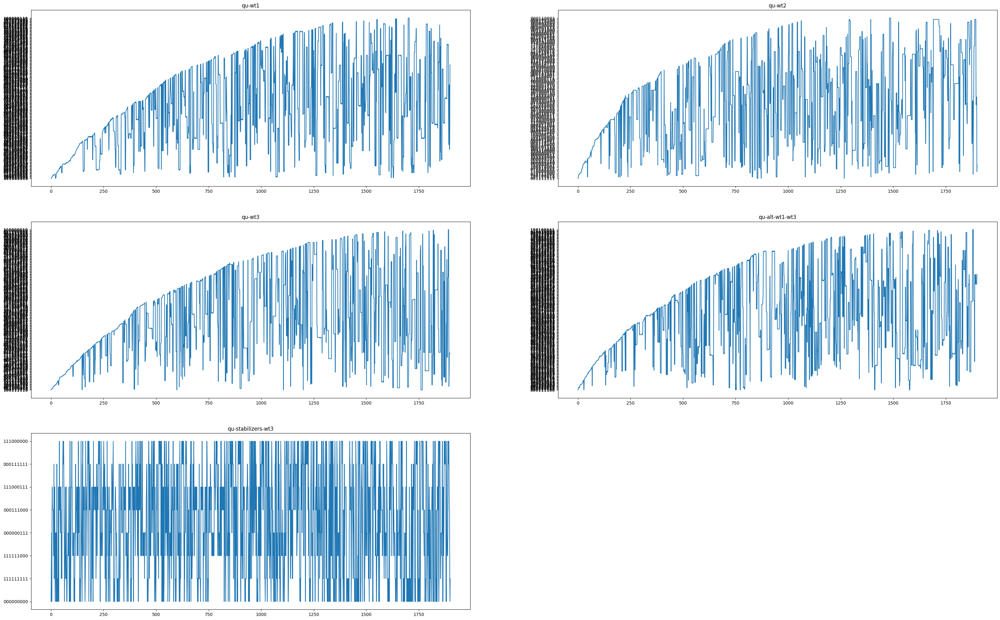

In [19]:
plt.figure(figsize= (25,16))
plot_mcmc_iterations(MIXINGDATA2[5]);plot_mcmc_iterations(MIXINGDATA2[6])

In [32]:
mcmc_settings_to_plot = ['qu-wt1', 'qu-wt2', 'qu-stabilizers-wt3', 'qu-wt3']

100%|██████████| 10/10 [00:00<00:00, 13.81it/s]


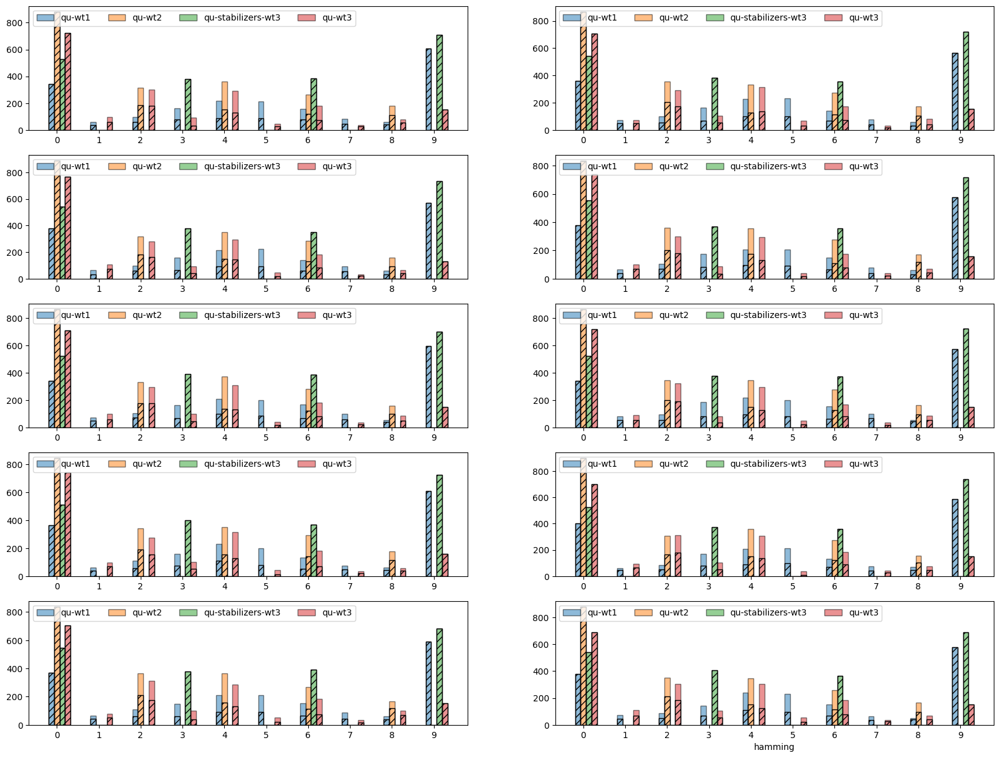

100%|██████████| 10/10 [00:00<00:00, 20.67it/s]


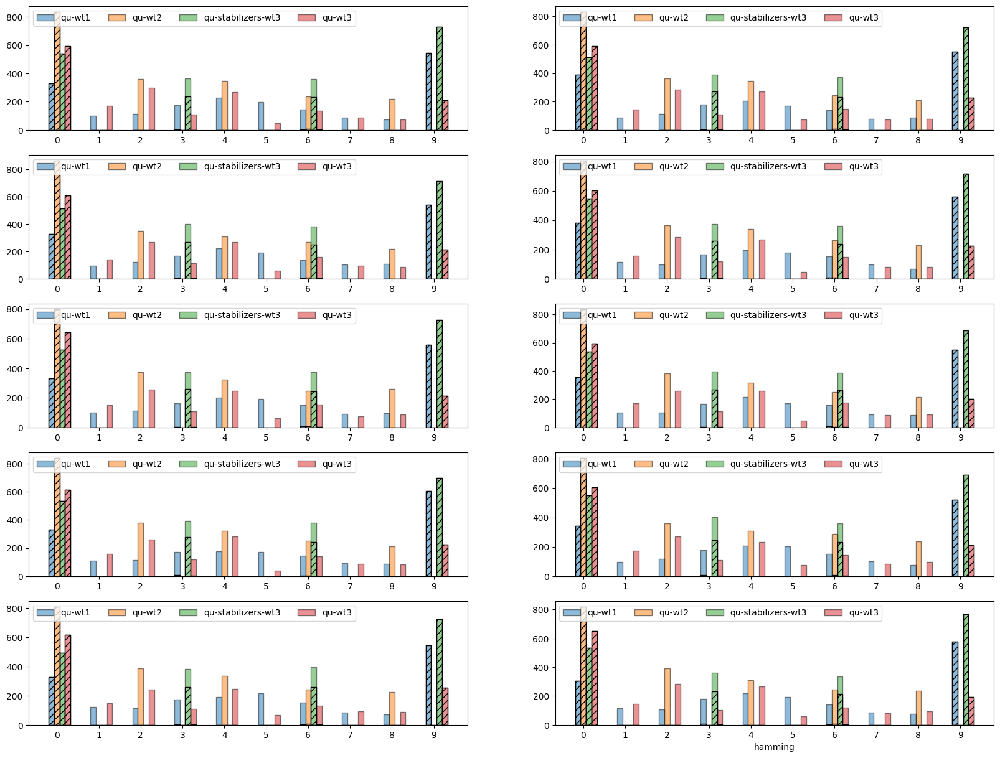

In [21]:
PLOT_MCMC_STATISTICS(MIXINGRESULT2, mcmc_types_to_plot= mcmc_settings_to_plot, statistic_to_plot= 'hamming');PLOT_MCMC_STATISTICS(MIXINGRESULT, mcmc_types_to_plot= mcmc_settings_to_plot, statistic_to_plot= 'hamming')

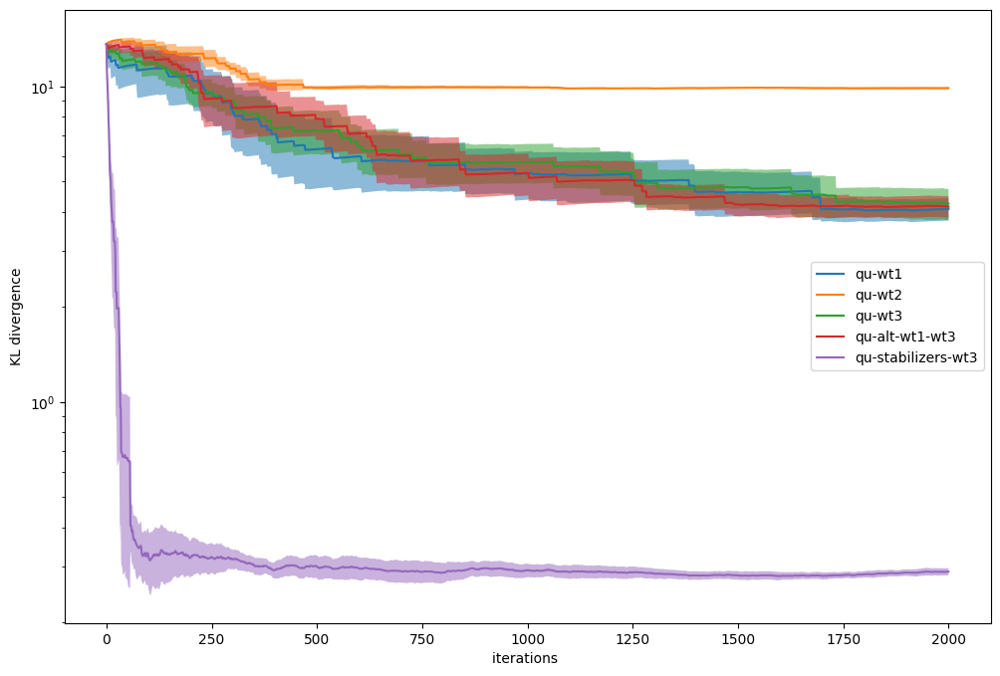

In [22]:
PLOT_KL_DIV(MIXINGRESULT2, mcmc_types_to_plot= mcmc_settings_to_experiment)

## EXP 3

In [31]:
experiment3_filename = 'SamplingData/BAS3/MIXINGDATA_BAS3_3.pkl'
experimentresult3_filename = 'SamplingData/BAS3/MIXINGRESULT_BAS3_3.pkl'

In [32]:
with open(experiment3_filename, 'rb') as f: MIXINGDATA3 = pickle.load(f)
with open(experimentresult3_filename, 'rb') as f: MIXINGRESULT3 = pickle.load(f)

In [46]:
num_chains = 10
mcmc_settings_to_experiment = ['qu-wt1', 'qu-wt2', 'qu-wt3', 'qu-stabilizers-wt3']

In [47]:
# MIXINGDATA3 = { gamma_range : { i: {} for i in range(num_chains)  } for gamma_range in GAMMA_RANGES.keys() }

In [48]:
# for gamma_range in GAMMA_RANGES.keys():
#     for chain_no in tqdm(range(num_chains), desc= 'GAMMA RANGE: ' +str(gamma_range)):
#         for mcmc_setting in mcmc_settings_to_experiment:

#             steps = 3000
#             mcmc_chain = quantum_enhanced_mcmc_2(
#                 n_hops= steps,
#                 model= model,
#                 temperature= 1/beta,
#                 verbose= False,
#                 name= mcmc_setting,
#                 gamma_range= GAMMA_RANGES[gamma_range],
#                 initial_state= bpd.get_sample(1)[0],
#                 mixer= MIXER_SETTINGS[mcmc_setting]['mixer']
#             )
            
#             MIXINGDATA3[gamma_range][chain_no][mcmc_setting] = mcmc_chain
#             with open(experiment3_filename, 'wb') as f: pickle.dump(MIXINGDATA3, f)

GAMMA RANGE: e: 100%|██████████| 10/10 [11:27<00:00, 68.79s/it]


In [11]:
# MIXINGRESULT3 = { gamma_range : {} for gamma_range in GAMMA_RANGES.keys() } 


In [12]:
for gamma_range in GAMMA_RANGES.keys():
    MIXINGRESULT3[gamma_range] = ProcessMCMCData(MIXINGDATA3[gamma_range], exact_sampled_model, savefile_path= 'SamplingData/BAS3/', name= "MIXINGRESULT_BAS3_3")
    MIXINGRESULT3[gamma_range].PROCESS_ALL(save_data= True)

OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]


#### Results

##### Trajectory Viz

gamma range : (0.0, 0.1)


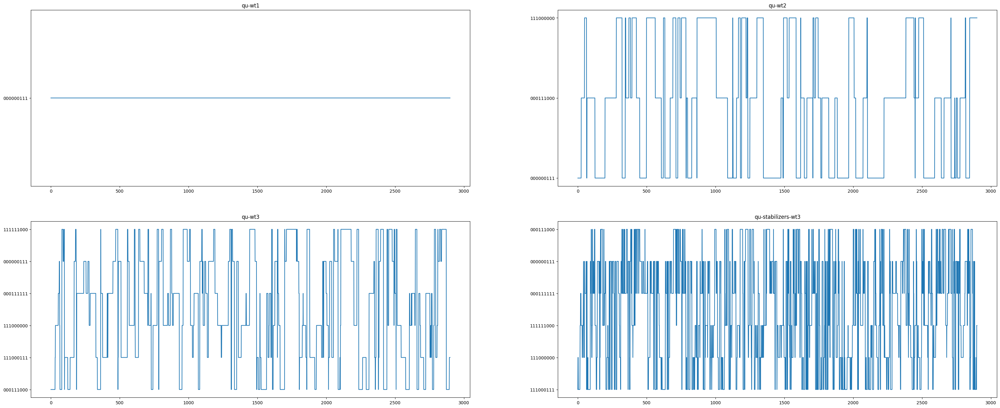

gamma range : (0.1, 0.3)


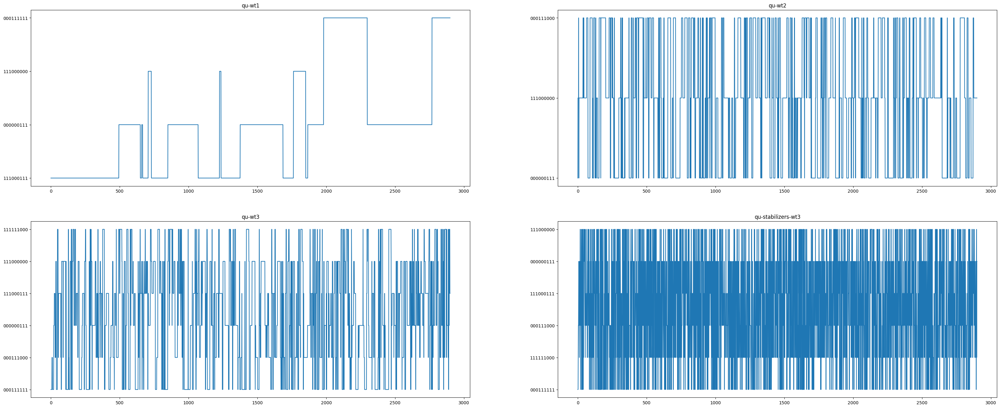

gamma range : (0.3, 0.6)


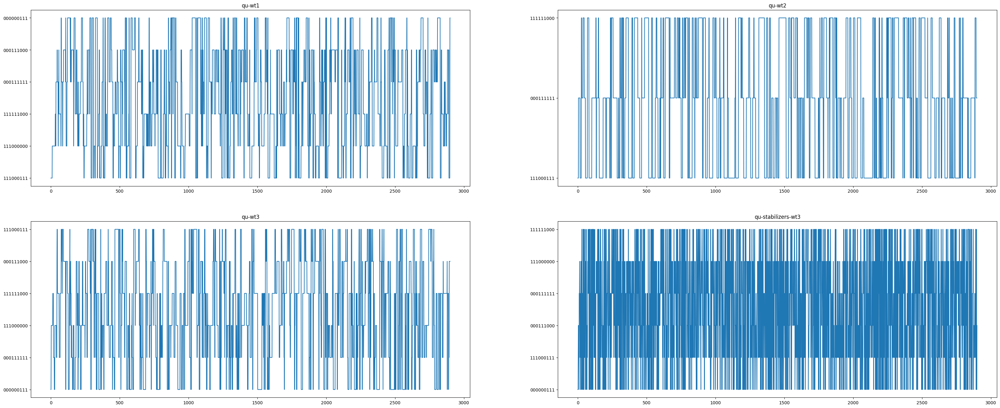

gamma range : (0.6, 0.9)


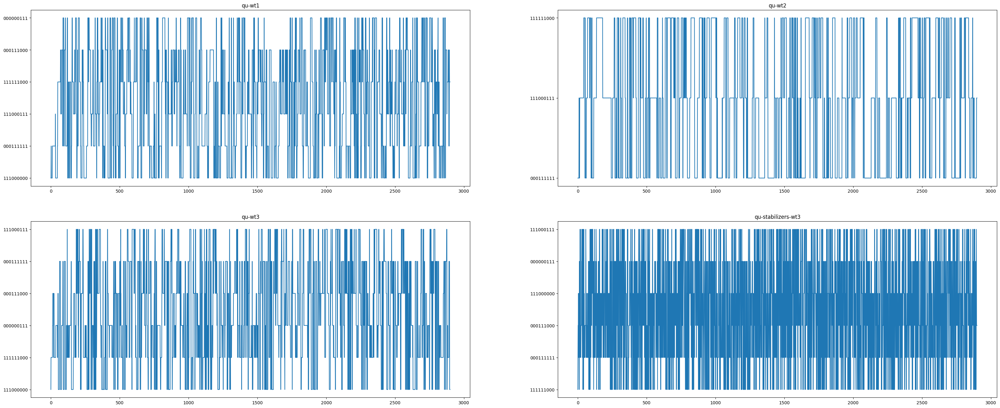

gamma range : (0.9, 1.0)


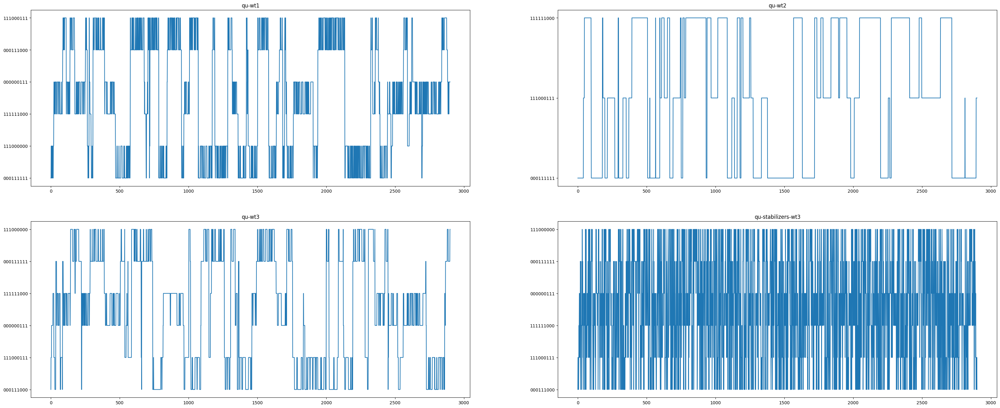

In [33]:
for gamma_range in GAMMA_RANGES.keys():
    print('gamma range : '+ str(GAMMA_RANGES[gamma_range]))
    plot_mcmc_iterations(MIXINGDATA3[gamma_range][np.random.randint(0,num_chains)], )

##### KL Div

GAMMA-RANGE: (0.0, 0.1)


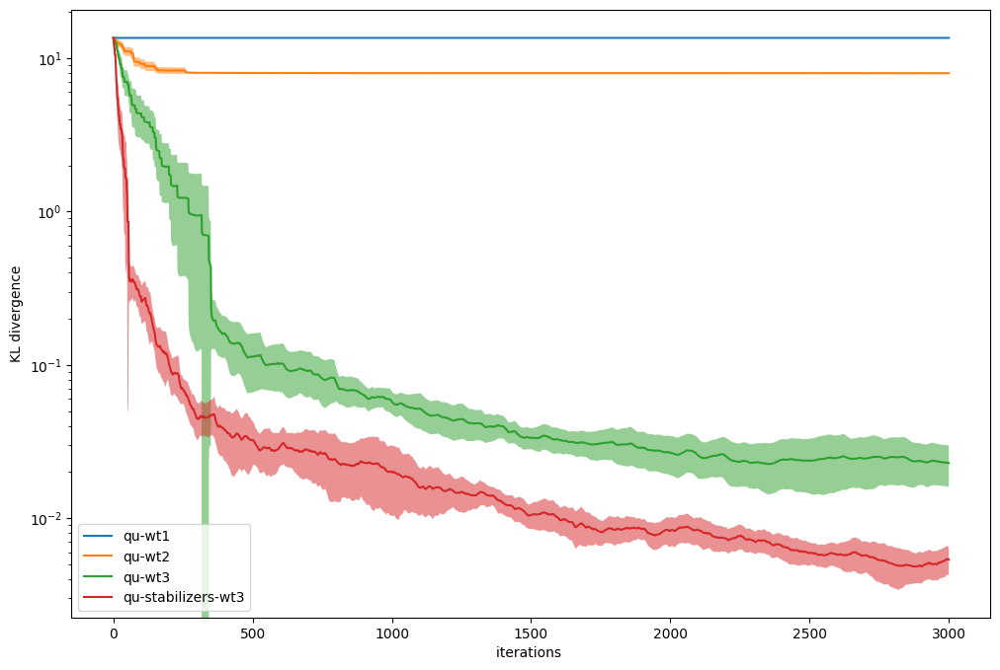

GAMMA-RANGE: (0.1, 0.3)


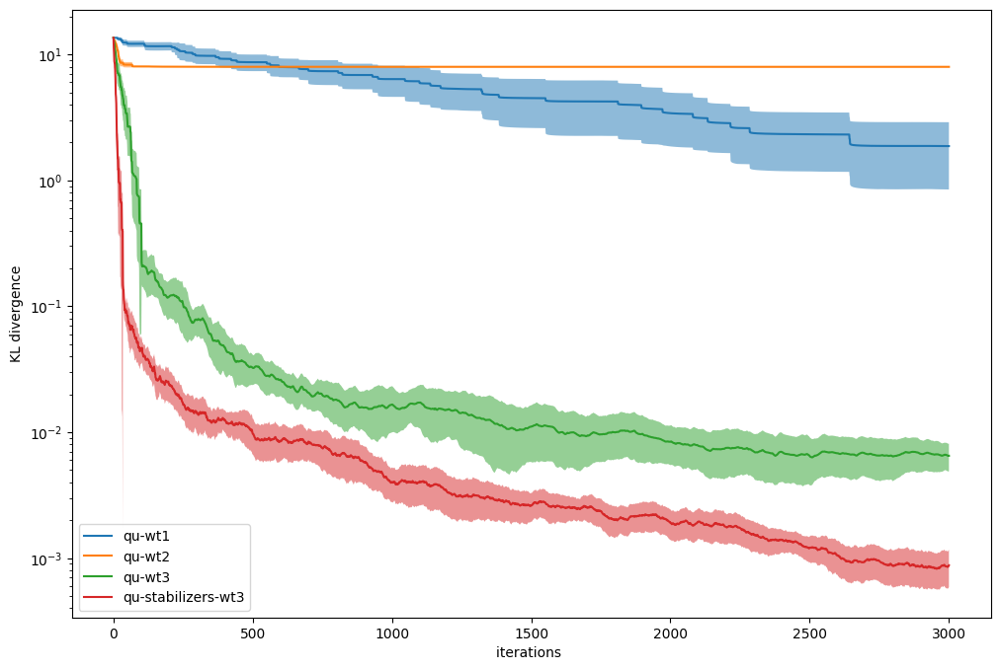

GAMMA-RANGE: (0.3, 0.6)


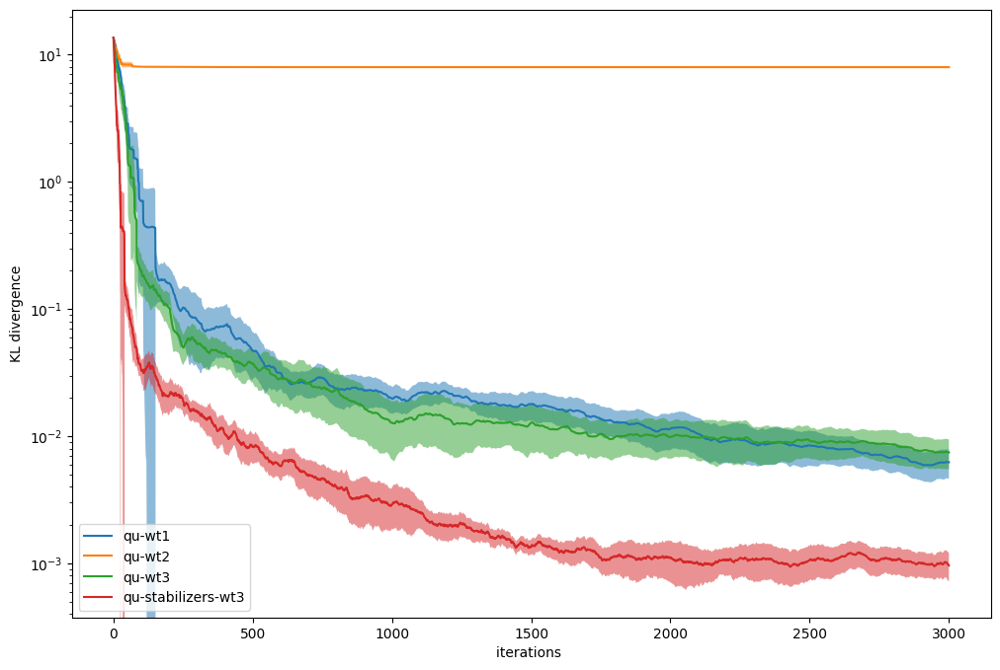

GAMMA-RANGE: (0.6, 0.9)


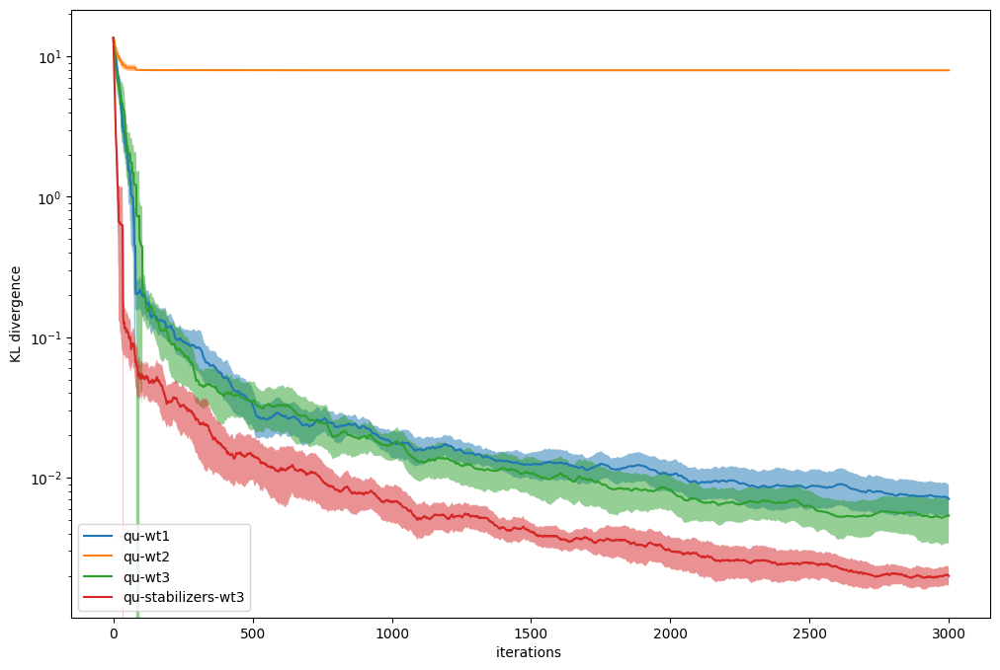

GAMMA-RANGE: (0.9, 1.0)


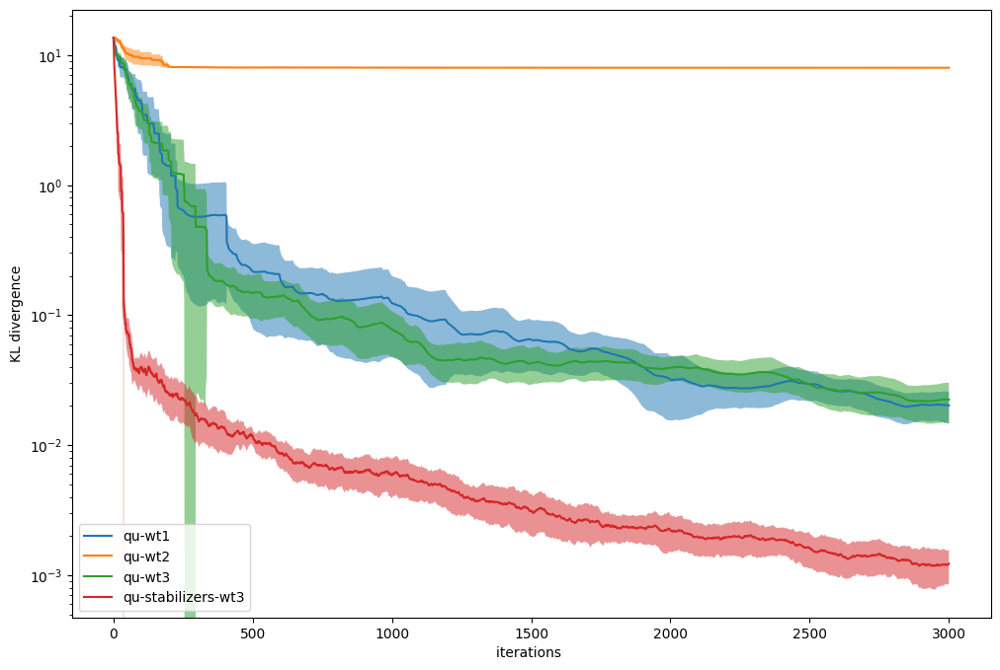

In [24]:
for k in GAMMA_RANGES.keys():
    print('GAMMA-RANGE: ' + str(GAMMA_RANGES[k]))
    PLOT_KL_DIV(MIXINGRESULT3[k])
    # plt.title('GAMMA-RANGE: ' + str(k))
    

##### Magnetisation

GAMMA-RANGE: (0.0, 0.1)


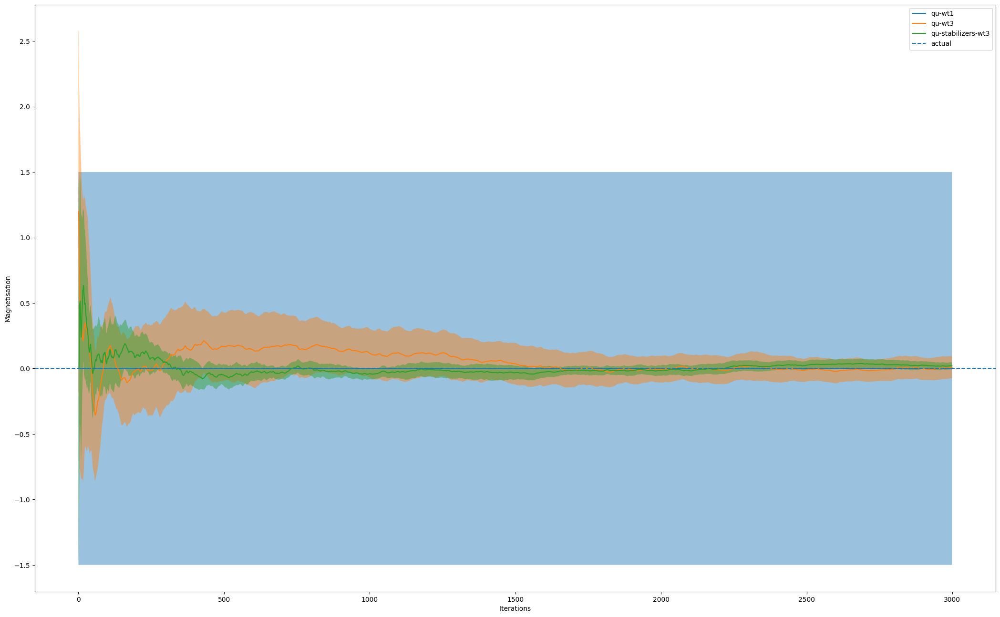

GAMMA-RANGE: (0.1, 0.3)


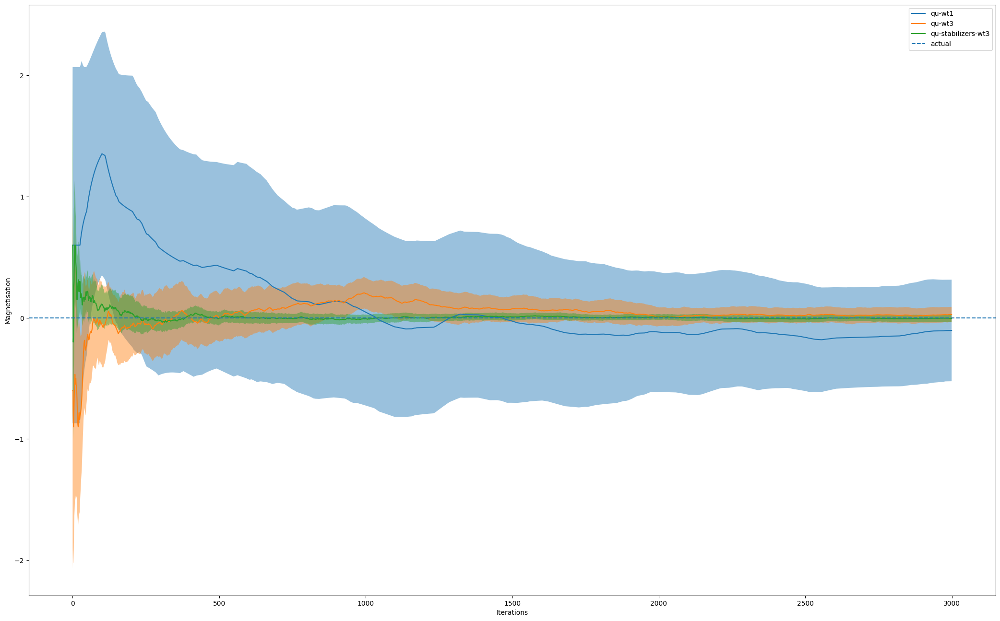

GAMMA-RANGE: (0.3, 0.6)


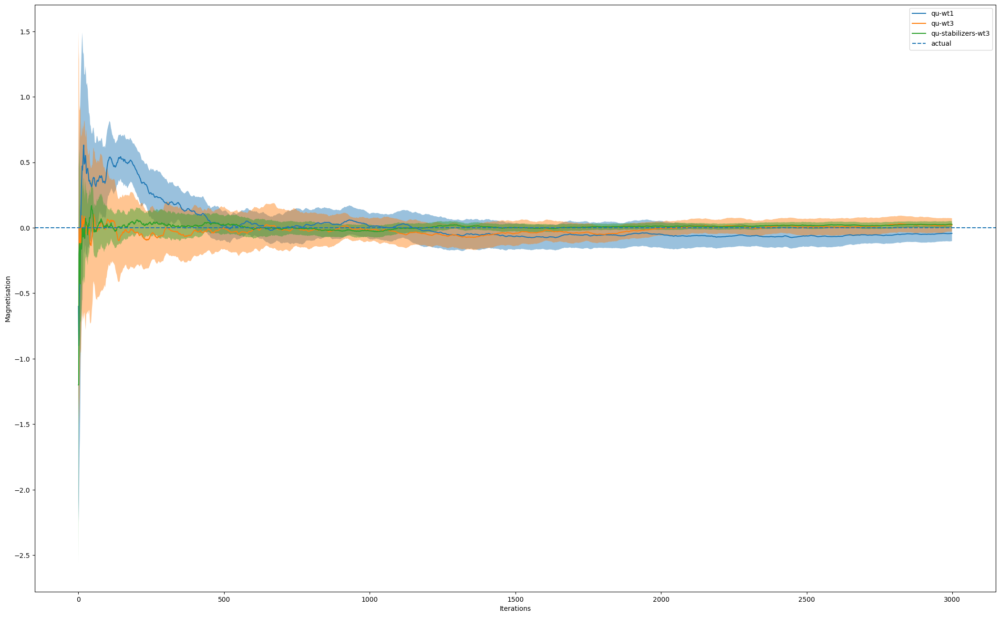

GAMMA-RANGE: (0.6, 0.9)


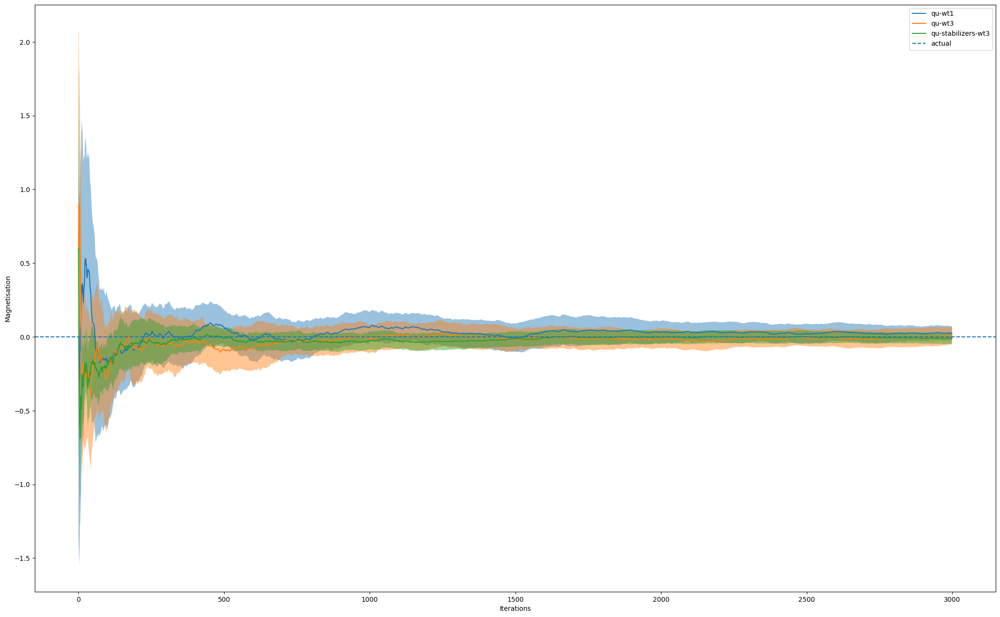

GAMMA-RANGE: (0.9, 1.0)


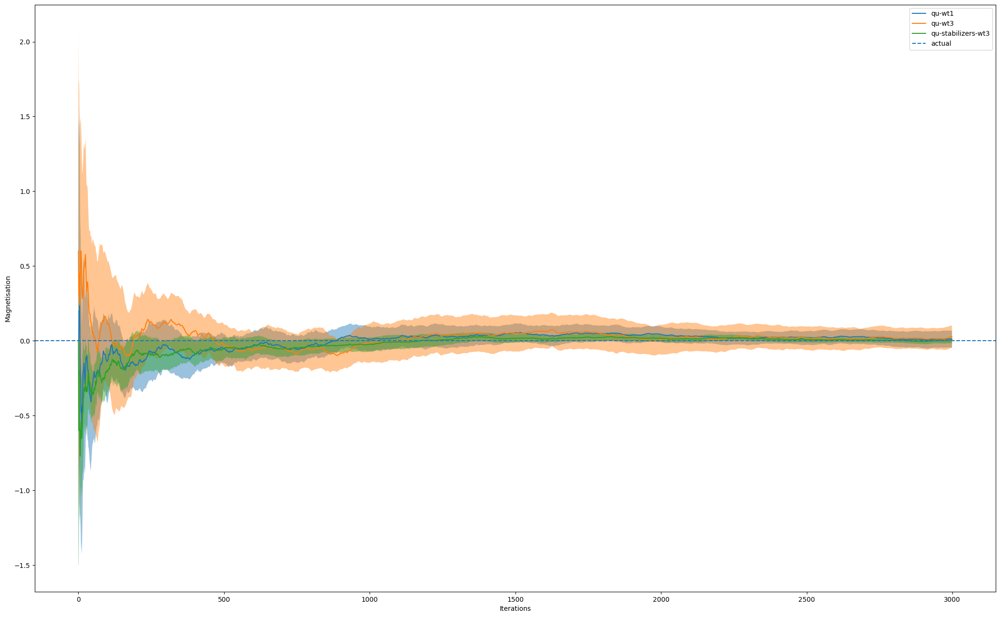

In [30]:
for k in GAMMA_RANGES.keys():
    print('GAMMA-RANGE: ' + str(GAMMA_RANGES[k]))
    PLOT_MAGNETISATION(MIXINGRESULT3[k], mcmc_types_to_plot= ['qu-wt1', 'qu-wt3', 'qu-stabilizers-wt3'])
    # plt.title('GAMMA-RANGE: ' + str(k))

##### Proposition Analytics

GAMMA-RANGE: (0.0, 0.1)


100%|██████████| 10/10 [00:01<00:00,  8.20it/s]


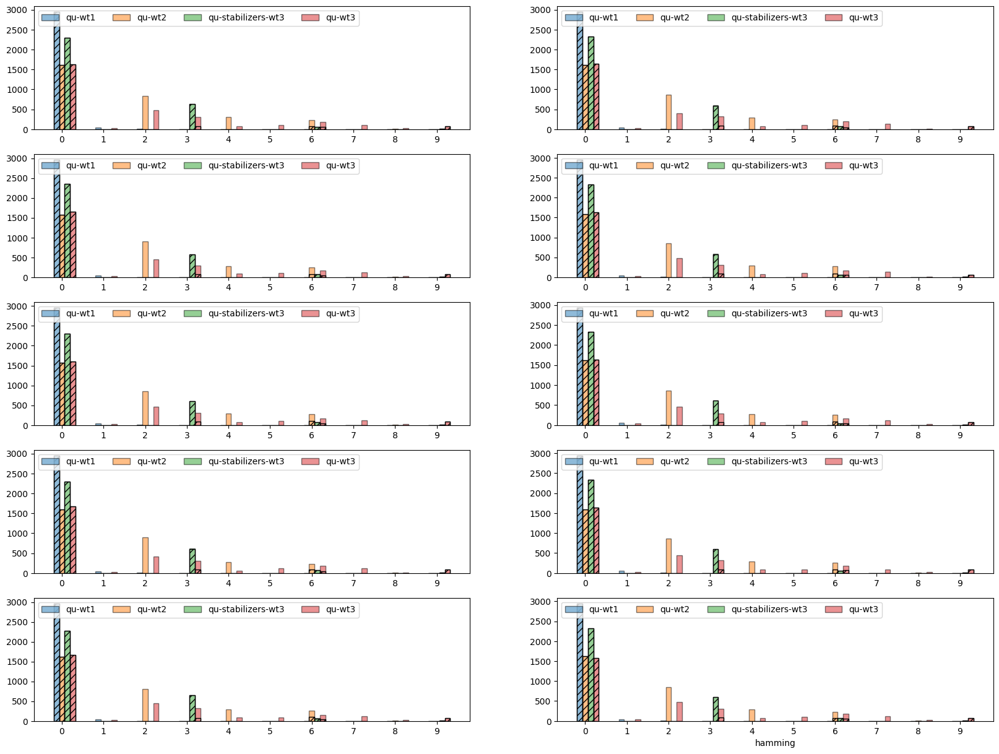

GAMMA-RANGE: (0.1, 0.3)


100%|██████████| 10/10 [00:01<00:00,  6.42it/s]


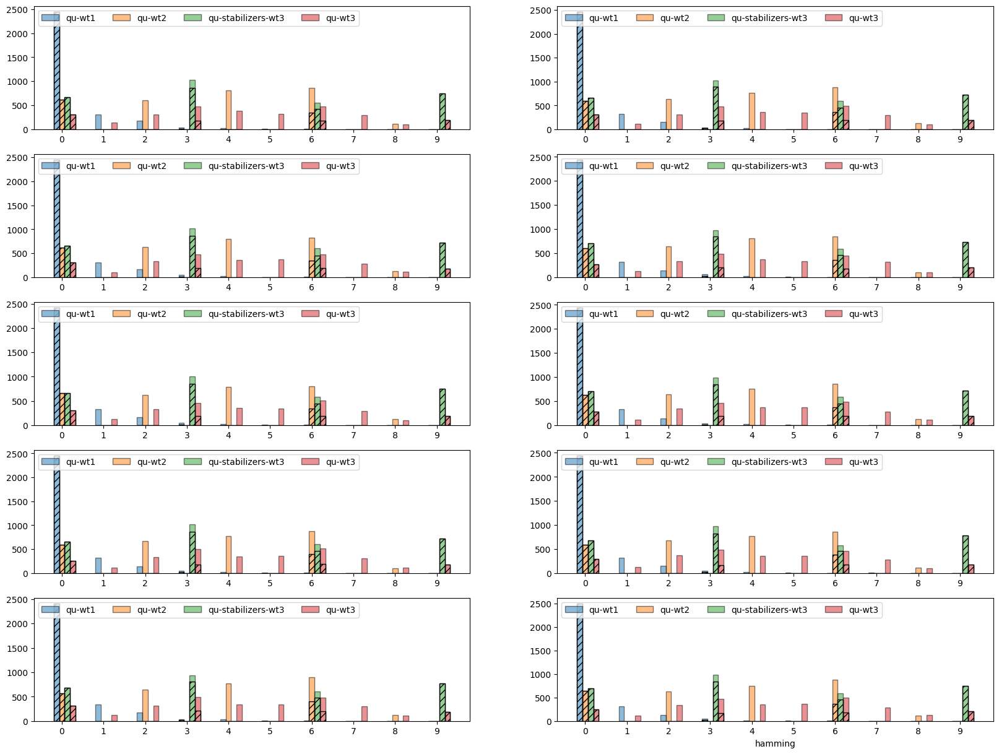

GAMMA-RANGE: (0.3, 0.6)


100%|██████████| 10/10 [00:01<00:00,  8.91it/s]


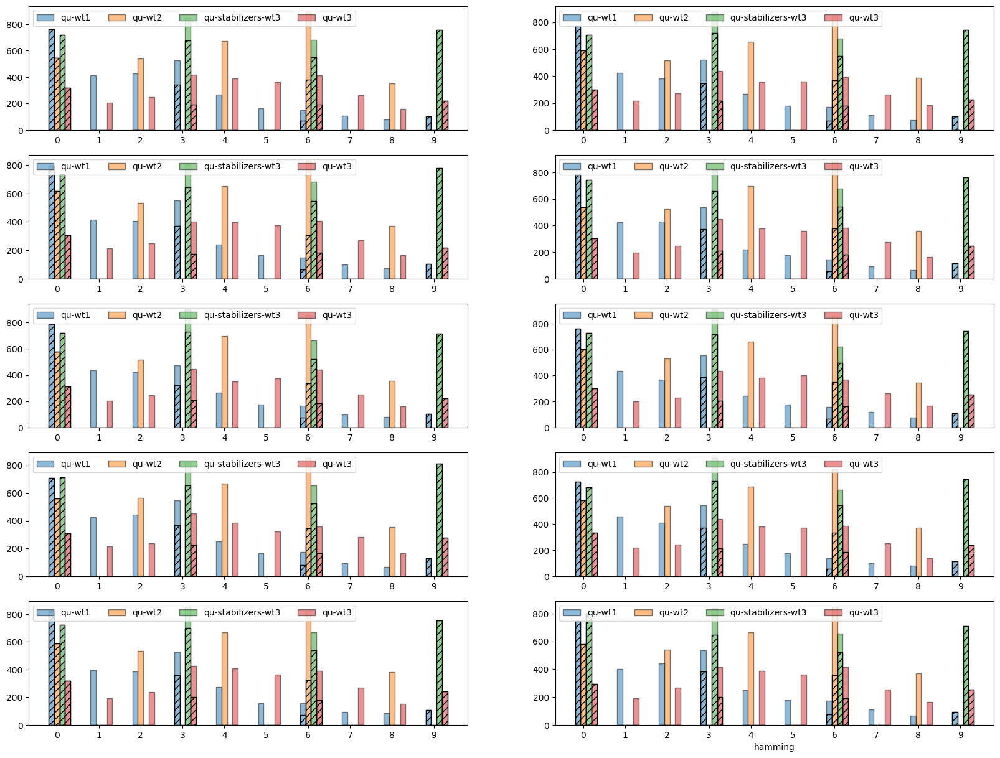

GAMMA-RANGE: (0.6, 0.9)


100%|██████████| 10/10 [00:01<00:00,  7.26it/s]


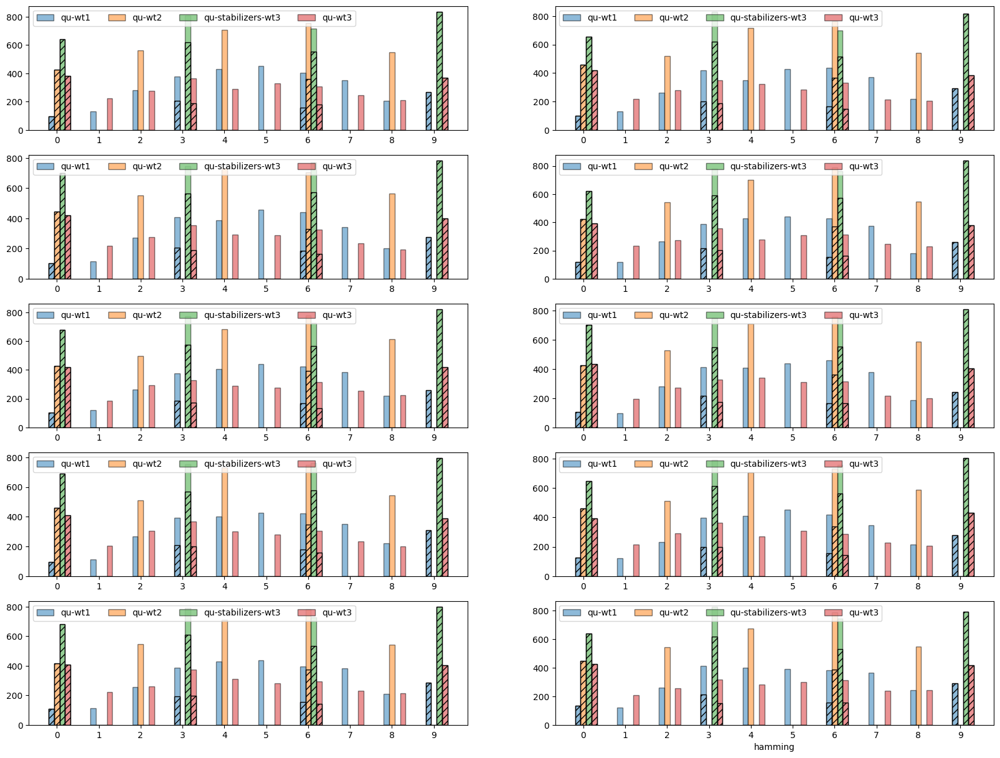

GAMMA-RANGE: (0.9, 1.0)


100%|██████████| 10/10 [00:01<00:00,  5.65it/s]


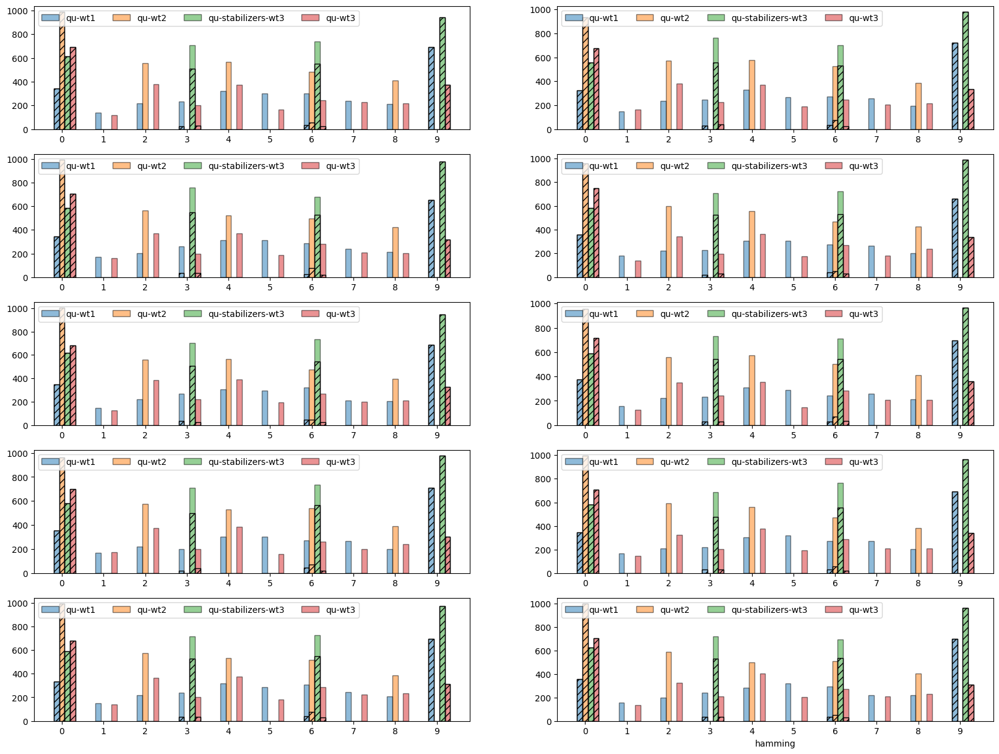

In [33]:
for k in GAMMA_RANGES.keys():
    print('GAMMA-RANGE: ' + str(GAMMA_RANGES[k]))
    PLOT_MCMC_STATISTICS(MIXINGRESULT3[k], mcmc_types_to_plot= mcmc_settings_to_plot, statistic_to_plot= 'hamming')